# 資料前處裡

## 一、瀏覽資料 "腹膜透析血清白蛋白(Albumin)檢查比率.csv"

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.font_manager import fontManager
fontManager.addfont('TaipeiSansTCBeta-Regular.ttf')
plt.rc('font', family='Taipei Sans TC Beta')

data1 = pd.read_csv("腹膜透析血清白蛋白(Albumin)檢查比率.csv")
data1.head()

,年度季別,醫事機構代碼,醫事機構名稱,特約類別,血清白蛋白檢查人數,腹膜透析人數,血清白蛋白受檢率,檢測方法,院所腎臟專科醫師數,院所是否參與健保計畫,院所是否參與國健署計畫,縣市別,鄉鎮別
0,95年第一季,101090517,臺北市立聯合醫院,區域醫院,97.0,112.0,0.8660,BCP,11.0,否,否,臺北市,大同區
1,95年第二季,101090517,臺北市立聯合醫院,區域醫院,101.0,109.0,0.9266,BCP,11.0,否,否,臺北市,大同區
2,95年第三季,101090517,臺北市立聯合醫院,區域醫院,109.0,114.0,0.9561,BCP,11.0,否,否,臺北市,大同區
3,95年第四季,101090517,臺北市立聯合醫院,區域醫院,113.0,116.0,0.9741,BCP,11.0,否,否,臺北市,大同區
4,96年第一季,101090517,臺北市立聯合醫院,區域醫院,126.0,132.0,0.9545,BCP,12.0,是,否,臺北市,大同區


In [37]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6931 entries, 0 to 6930
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   年度季別         6931 non-null   object 
 1   醫事機構代碼       6931 non-null   int64  
 2   醫事機構名稱       6931 non-null   object 
 3   特約類別         6931 non-null   object 
 4   血清白蛋白檢查人數    6931 non-null   float64
 5   腹膜透析人數       6931 non-null   float64
 6   血清白蛋白受檢率     6931 non-null   float64
 7   檢測方法         6931 non-null   object 
 8   院所腎臟專科醫師數    6919 non-null   float64
 9   院所是否參與健保計畫   6931 non-null   object 
 10  院所是否參與國健署計畫  6806 non-null   object 
 11  縣市別          6931 non-null   object 
 12  鄉鎮別          6931 non-null   object 
dtypes: float64(4), int64(1), object(8)
memory usage: 704.1+ KB


## 檢查缺失值

In [38]:
# 檢查欄位是否有 NaN (空值)
for index, col in enumerate(data1.columns):
  print(f"第{index+1}個欄位(i.e., {col}) 的缺失值有{data1[col].isnull().sum()}筆")

第1個欄位(i.e., 年度季別) 的缺失值有0筆
第2個欄位(i.e., 醫事機構代碼) 的缺失值有0筆
第3個欄位(i.e., 醫事機構名稱) 的缺失值有0筆
第4個欄位(i.e., 特約類別) 的缺失值有0筆
第5個欄位(i.e., 血清白蛋白檢查人數) 的缺失值有0筆
第6個欄位(i.e., 腹膜透析人數) 的缺失值有0筆
第7個欄位(i.e., 血清白蛋白受檢率) 的缺失值有0筆
第8個欄位(i.e., 檢測方法) 的缺失值有0筆
第9個欄位(i.e., 院所腎臟專科醫師數) 的缺失值有12筆
第10個欄位(i.e., 院所是否參與健保計畫) 的缺失值有0筆
第11個欄位(i.e., 院所是否參與國健署計畫) 的缺失值有125筆
第12個欄位(i.e., 縣市別) 的缺失值有0筆
第13個欄位(i.e., 鄉鎮別) 的缺失值有0筆


## 將"院所是否參與國健署計畫"的缺失欄添加為"否"，
## 將"院所腎臟專科醫師數"的缺失欄添加為該欄總和的平均值

In [39]:
data1['院所是否參與國健署計畫'].fillna('否', inplace=True)

# 計算欄位的平均值
mean_value = data1['院所腎臟專科醫師數'].mean()
# 將空值替換為平均值
data1['院所腎臟專科醫師數'].fillna(mean_value, inplace=True)

In [40]:
# 檢查欄位是否有 NaN (空值)
for index, col in enumerate(data1.columns):
  print(f"第{index+1}個欄位(i.e., {col}) 的缺失值有{data1[col].isnull().sum()}筆")

第1個欄位(i.e., 年度季別) 的缺失值有0筆
第2個欄位(i.e., 醫事機構代碼) 的缺失值有0筆
第3個欄位(i.e., 醫事機構名稱) 的缺失值有0筆
第4個欄位(i.e., 特約類別) 的缺失值有0筆
第5個欄位(i.e., 血清白蛋白檢查人數) 的缺失值有0筆
第6個欄位(i.e., 腹膜透析人數) 的缺失值有0筆
第7個欄位(i.e., 血清白蛋白受檢率) 的缺失值有0筆
第8個欄位(i.e., 檢測方法) 的缺失值有0筆
第9個欄位(i.e., 院所腎臟專科醫師數) 的缺失值有0筆
第10個欄位(i.e., 院所是否參與健保計畫) 的缺失值有0筆
第11個欄位(i.e., 院所是否參與國健署計畫) 的缺失值有0筆
第12個欄位(i.e., 縣市別) 的缺失值有0筆
第13個欄位(i.e., 鄉鎮別) 的缺失值有0筆


In [41]:
print(data1['檢測方法'].value_counts())

檢測方法
BCG    4939
BCP    1992
Name: count, dtype: int64


In [42]:
# 因基隆長庚的95年第一季的BCG資料會讓折線圖有誤，所以把這行資料刪除

# 根據特定條件篩選行
rows_to_drop = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCG')& (data1['年度季別'] == '95年第一季')].index

data1.drop(rows_to_drop, inplace=True)

In [43]:
# newdata2 = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG') & (data1['特約類別'] == '醫學中心')]['血清白蛋白檢查人數'].tolist()

# mean_value2 = sum(newdata2) / len(newdata2)

# high_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG') & (data1['年度季別'] == '108年第二季')].index.tolist()

# data1.loc[high_data, '血清白蛋白檢查人數'] = mean_value2

# print(data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG') & (data1['年度季別'] == '108年第二季')])

In [44]:
# 因臺北榮總在108年第二季度的血清白蛋白檢查人數資料與其他資料差距巨大，為離均值，可能原因是資料寫錯，因此把該筆資料改成臺北榮民總醫院從99年至112年之血清白蛋白檢查人數的平均

# 計算平均值
mean_value = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG') & (data1['特約類別'] == '醫學中心')]['血清白蛋白檢查人數'].mean() # 193.27083269515057

# 選擇符合條件的行
condition = (data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['年度季別'] == '108年第二季')

# 將特定欄位的值替換為平均值
data1.loc[condition, '血清白蛋白檢查人數'] = mean_value



In [45]:
# 因臺北榮總在108年第二季度的血清白蛋白受檢率資料與其他資料差距巨大，為離均值，可能原因是資料寫錯，因此把該筆資料改成臺北榮民總醫院從99年至112年之血清白蛋白受檢率的平均

# 計算平均值
mean_value = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG') & (data1['特約類別'] == '醫學中心')]['血清白蛋白受檢率'].mean() # 0.9814964181591004

# 選擇符合條件的行
condition = (data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['年度季別'] == '108年第二季')

# 將特定欄位的值替換為平均值
data1.loc[condition, '血清白蛋白受檢率'] = mean_value


### 列出個特約類別的各醫事機構

In [46]:
# 將資料轉換為 DataFrame
df = pd.DataFrame(data1)

# 先對醫院名稱進行去重
df.drop_duplicates(subset='醫事機構名稱', keep='first', inplace=True)

# 使用 groupby 函數將資料分組
grouped = df.groupby('特約類別')['醫事機構名稱'].apply(list)

# 創建一個新的 DataFrame 來顯示分組結果

result_df = pd.DataFrame(grouped)

result_df = result_df.explode('醫事機構名稱')

# 顯示結果
result_df

,醫事機構名稱
特約類別,
區域醫院,臺北市立聯合醫院
區域醫院,高雄市立聯合醫院
區域醫院,高雄市立大同醫院（委託財團法人私立高雄醫學大學經營)
區域醫院,衛生福利部基隆醫院
區域醫院,衛生福利部臺中醫院
...,...
醫學中心,臺北市立萬芳醫院－委託臺北醫學大學辦理
醫學中心,財團法人私立高雄醫學大學附設中和紀念醫院
醫學中心,中山醫學大學附設醫院


In [47]:
# # 創建 "檢測方法1" 欄位，將包含 "BCG" 的行標記為 True，其餘標記為 False
# data1['檢測方法1'] = data1['檢測方法'].str.contains('BCG')

# # 創建 "檢測方法2" 欄位，將包含 "BCP" 的行標記為 True，其餘標記為 False
# data1['檢測方法2'] = data1['檢測方法'].str.contains('BCP')

# # 將布林值轉換為字符串 "BCG" 和 "BCP"
# data1['檢測方法1'] = data1['檢測方法1'].replace({True: 'BCG', False: ''})
# data1['檢測方法2'] = data1['檢測方法2'].replace({True: 'BCP', False: ''})

# # 刪除原始欄位
# data1.drop(columns=['檢測方法'], inplace=True)

# data1.head(20)

## 分析

### 血清白蛋白檢查人數(BCG/榮總)

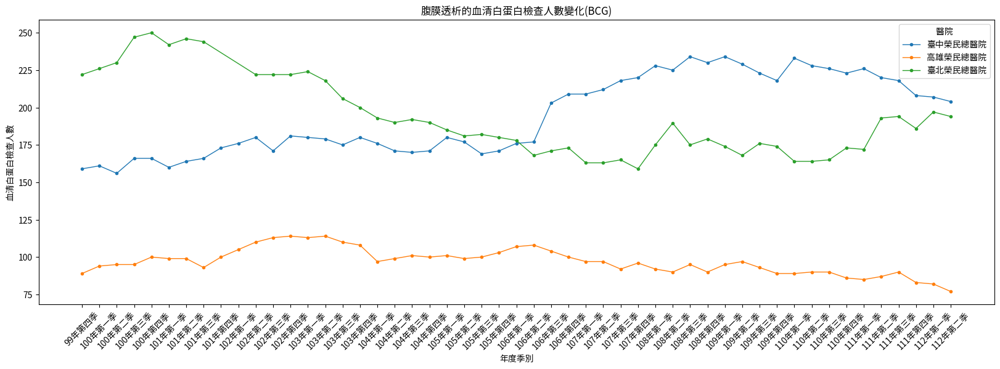

In [48]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白檢查人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCP/榮總)

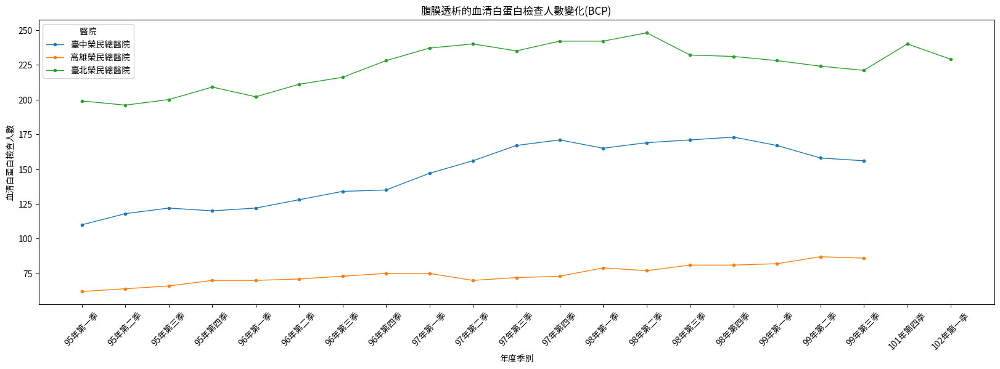

In [49]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白檢查人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCG/長庚)

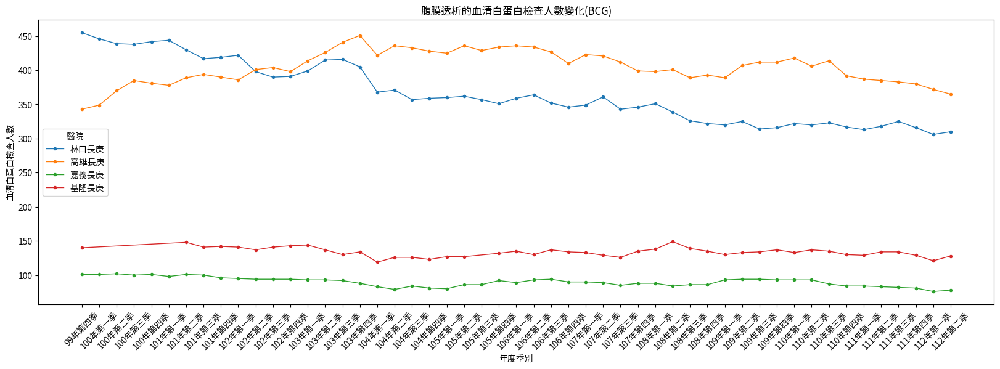

In [50]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白檢查人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCP/長庚)




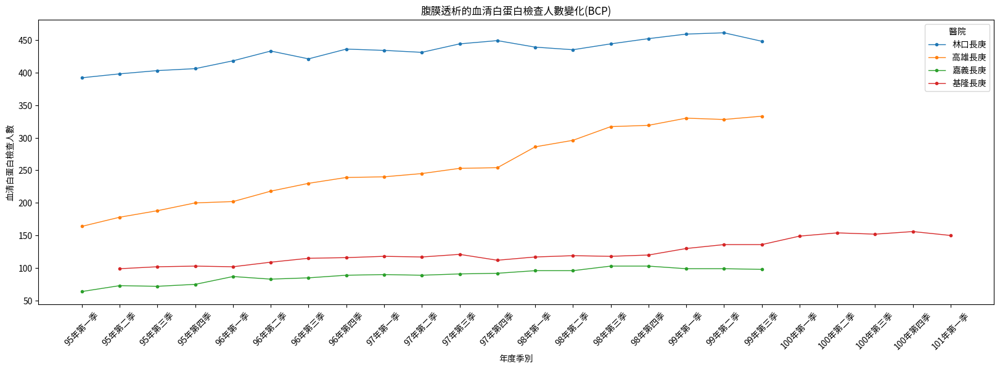

In [51]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白檢查人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCG/各縣市)

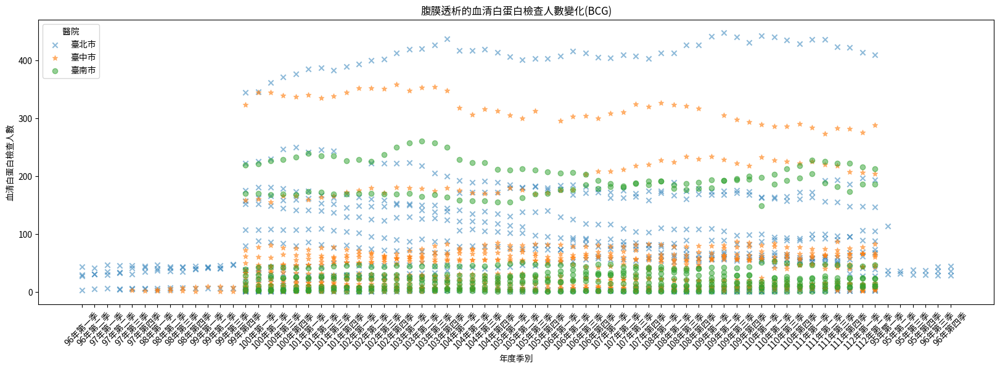

In [52]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))

plt.scatter(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], alpha=0.5)


# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白檢查人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院', loc='upper left')
plt.show()

### 血清白蛋白檢查人數(BCP/各縣市)

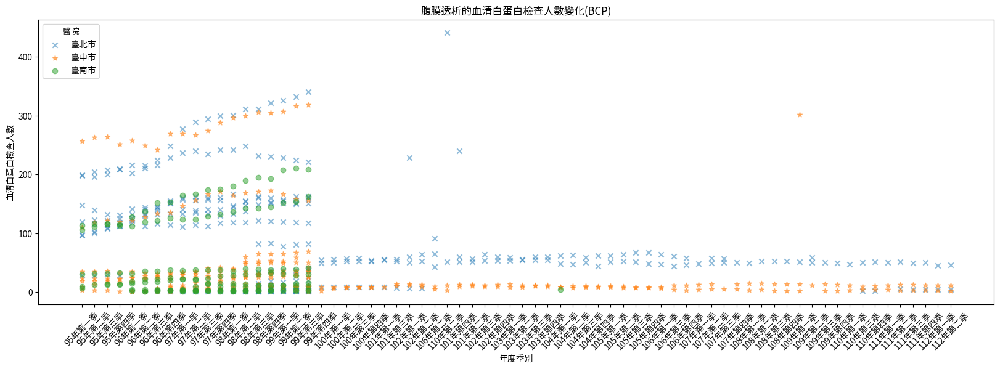

In [53]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))

plt.scatter(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], alpha=0.5)


# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白檢查人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院', loc='upper left')
plt.show()

### 血清白蛋白受檢率(BCG/榮總)

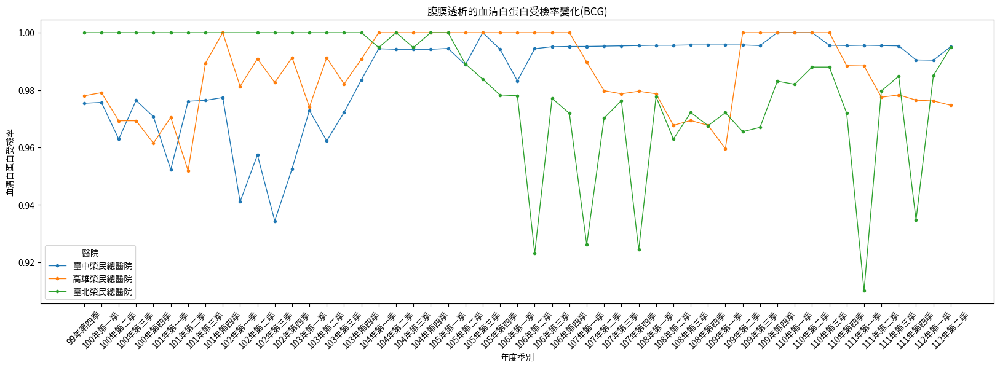

In [54]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白受檢率變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白受檢率(BCP/榮總)

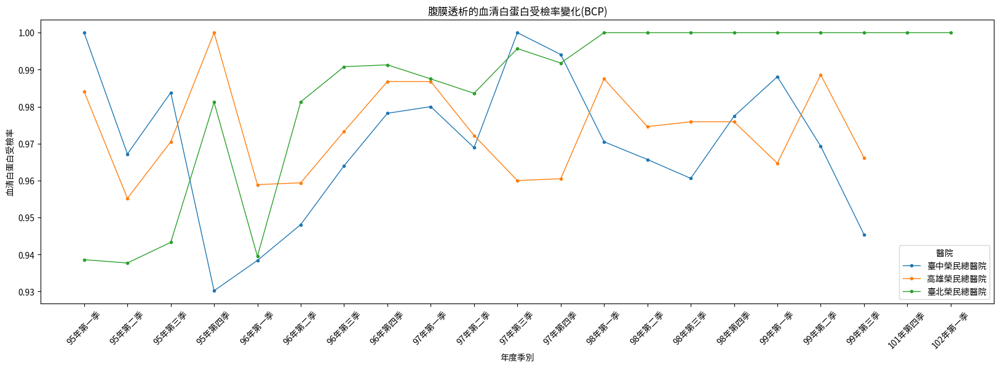

In [55]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白受檢率變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白受檢率 (BCG/長庚)

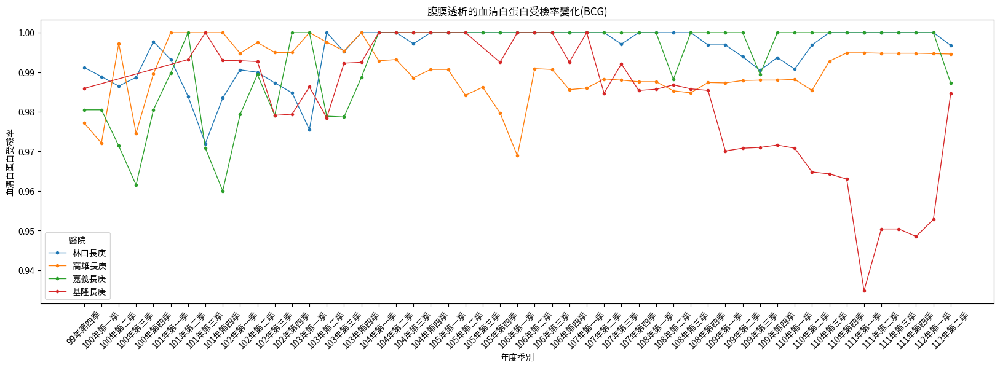

In [56]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白受檢率變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白受檢率 (BCP/長庚)

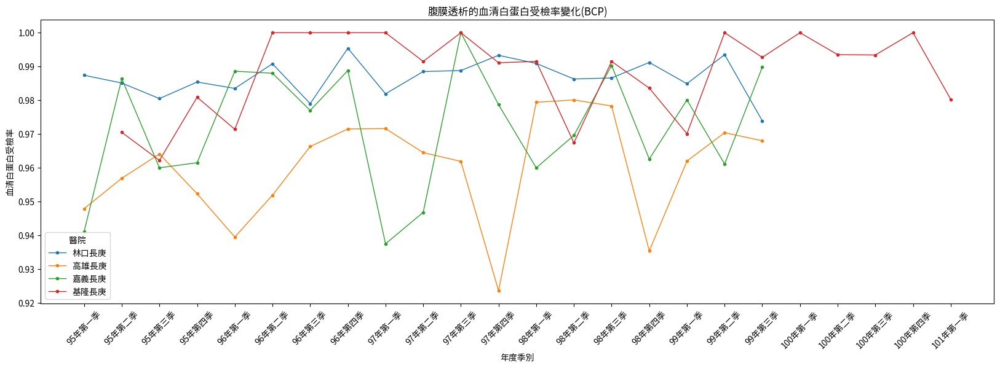

In [57]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析的血清白蛋白受檢率變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白受檢率(BCG/各縣市)

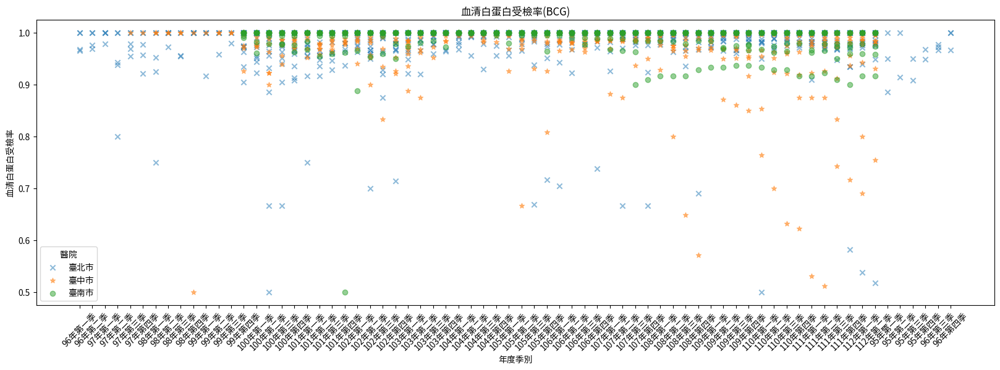

In [58]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))


plt.scatter(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], alpha=0.5)

# 添加標題和標籤
plt.title('血清白蛋白受檢率(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

### 血清白蛋白受檢率(BCP/各縣市)

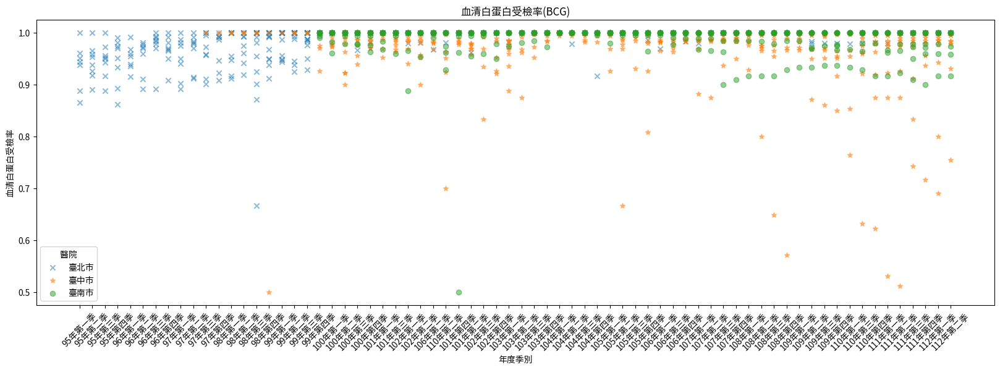

In [59]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))


plt.scatter(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], alpha=0.5)

# 添加標題和標籤
plt.title('血清白蛋白受檢率(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

### 腹膜透析人數 (BCG/榮總)

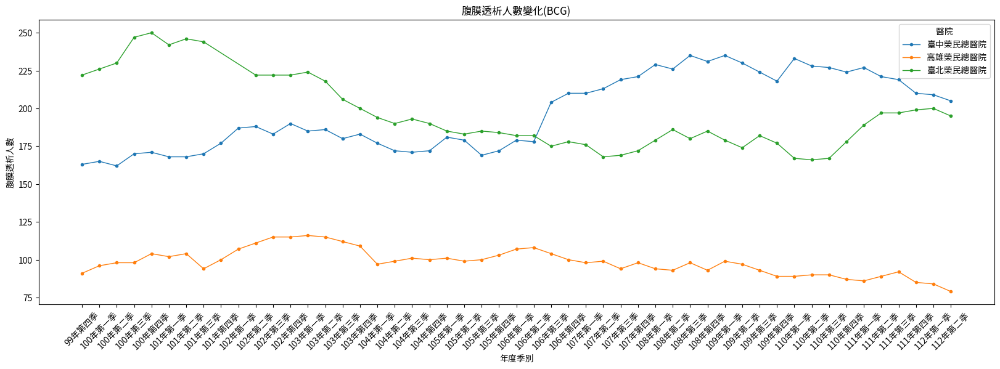

In [60]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('腹膜透析人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 腹膜透析人數 (BCP/榮總)

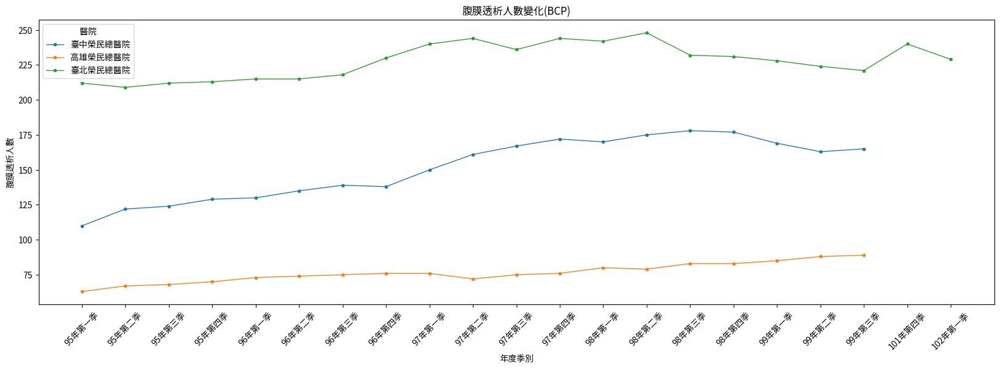

In [61]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('腹膜透析人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 腹膜透析人數 (BCG/長庚)

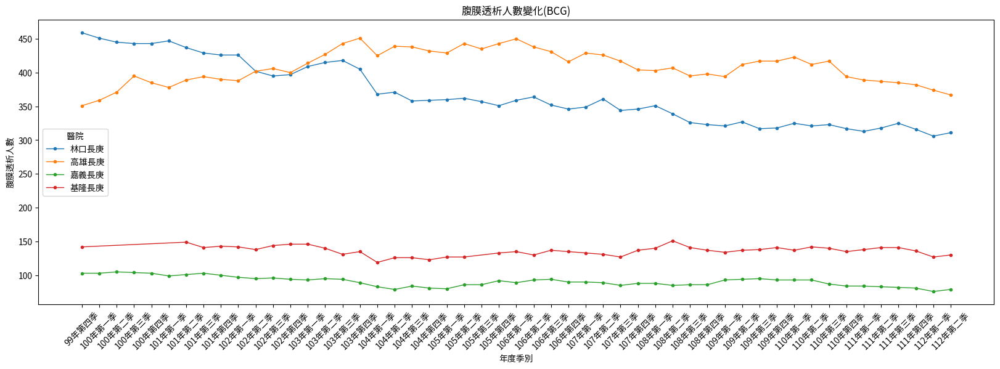

In [62]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('腹膜透析人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 腹膜透析人數 (BCP/長庚)

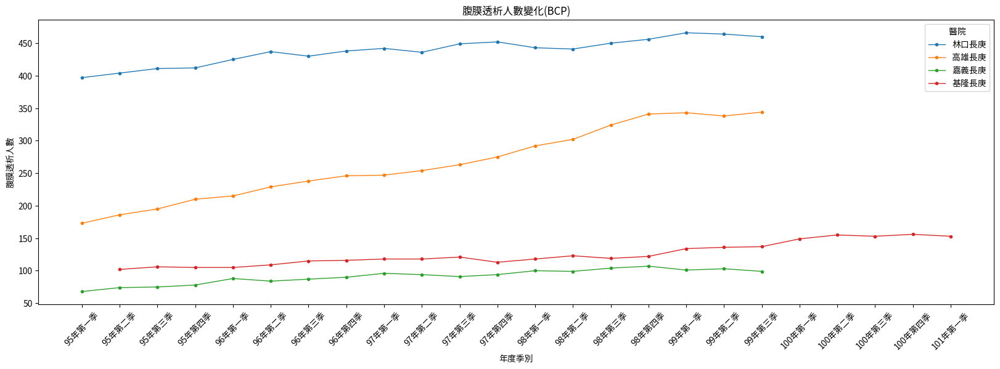

In [63]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['腹膜透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('腹膜透析人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('腹膜透析人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 腹膜透析人數 (BCG/各縣市)

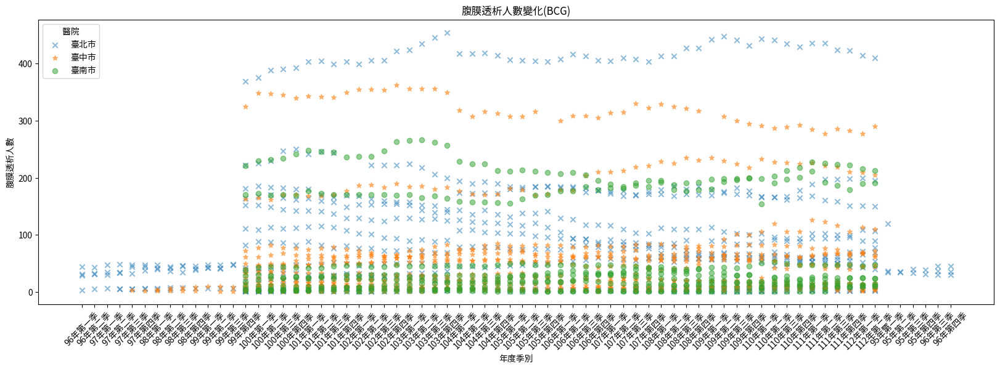

In [64]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCG')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))


plt.scatter(filtered_data['年度季別'], filtered_data['腹膜透析人數'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['腹膜透析人數'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['腹膜透析人數'], alpha=0.5)

# 添加標題和標籤
plt.title('腹膜透析人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('腹膜透析人數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院', loc='upper left')
plt.show()

### 腹膜透析人數 (BCP/各縣市)

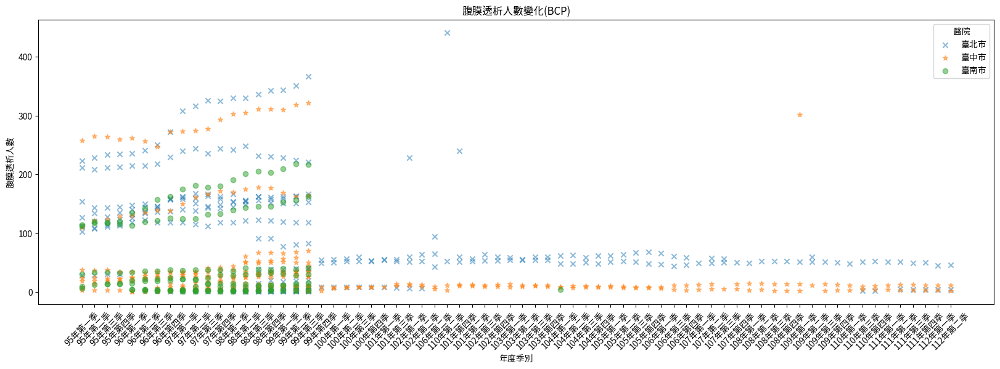

In [65]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCP')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))


plt.scatter(filtered_data['年度季別'], filtered_data['腹膜透析人數'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['腹膜透析人數'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['腹膜透析人數'], alpha=0.5)

# 添加標題和標籤
plt.title('腹膜透析人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('腹膜透析人數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

### 院所腎臟專科醫師數 (榮總)

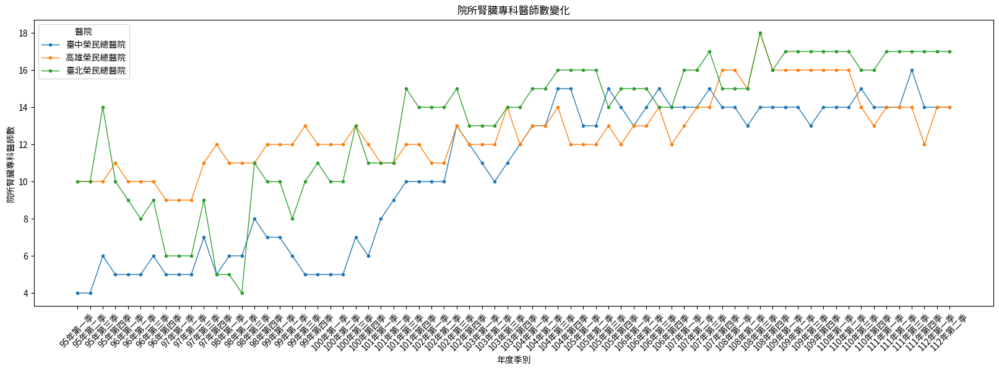

In [66]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '臺北榮民總醫院')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '臺中榮民總醫院')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '高雄榮民總醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('院所腎臟專科醫師數變化')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('院所腎臟專科醫師數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 院所腎臟專科醫師數 (長庚)

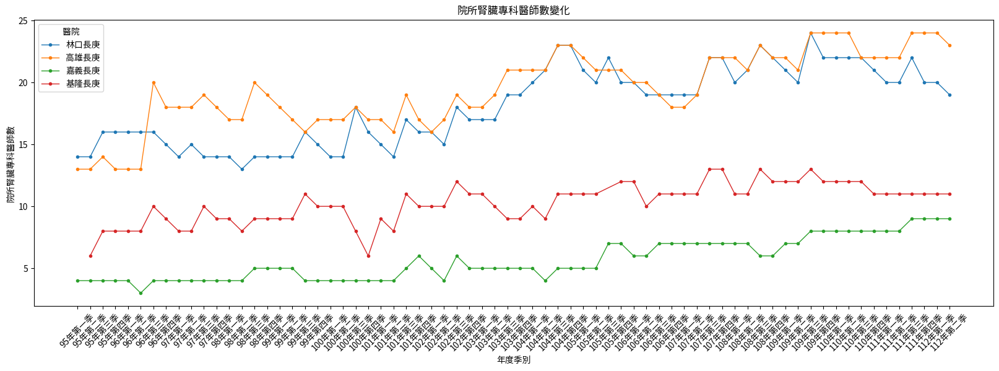

In [67]:
# 篩選符合條件的資料
filtered_data = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院')]

filtered_data1 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院')]

filtered_data2 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院')]

filtered_data3 = data1[(data1['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('院所腎臟專科醫師數變化')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('院所腎臟專科醫師數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 院所腎臟專科醫師數 (各縣市)

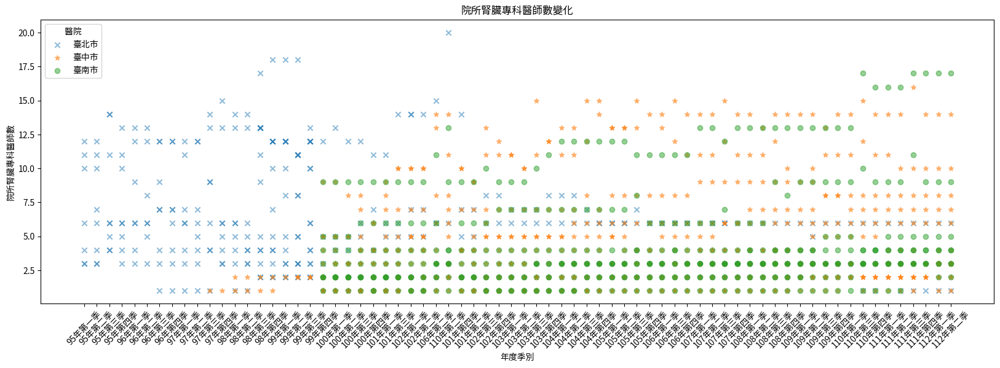

In [68]:
# 篩選符合條件的資料
filtered_data = data1[(data1['縣市別'] == '臺北市') & (data1['檢測方法'] == 'BCP')]

filtered_data1 = data1[(data1['縣市別'] == '臺中市') & (data1['檢測方法'] == 'BCG')]

filtered_data2 = data1[(data1['縣市別'] == '臺南市') & (data1['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))


plt.scatter(filtered_data['年度季別'], filtered_data['院所腎臟專科醫師數'], marker='x', alpha=0.5)
plt.scatter(filtered_data1['年度季別'], filtered_data1['院所腎臟專科醫師數'], marker='*', alpha=0.5)
plt.scatter(filtered_data2['年度季別'], filtered_data2['院所腎臟專科醫師數'], alpha=0.5)

# 添加標題和標籤
plt.title('院所腎臟專科醫師數變化')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('院所腎臟專科醫師數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

## 二、瀏覽資料 "血液透析血清白蛋白(Albumin)檢查比率.csv"

In [69]:
data2 = pd.read_csv("血液透析血清白蛋白(Albumin)檢查比率.csv")
data2.head()

,年度季別,醫事機構代碼,醫事機構名稱,特約類別,血清白蛋白檢查人數,血液透析人數,血清白蛋白平均值,血清白蛋白受檢率,檢測方法,院所腎臟專科醫師數,院所是否參與健保計畫,院所是否參與國健署計畫,縣市別,鄉鎮別
0,95年第一季,0101090517,臺北市立聯合醫院,區域醫院,463.0,504.0,3.92,0.9186,BCP,11.0,否,否,臺北市,大同區
1,95年第一季,0101090517,臺北市立聯合醫院,區域醫院,75.0,87.0,3.98,0.8620,BCG,11.0,否,否,臺北市,大同區
2,95年第二季,0101090517,臺北市立聯合醫院,區域醫院,74.0,79.0,3.95,0.9367,BCG,11.0,否,否,臺北市,大同區
3,95年第二季,0101090517,臺北市立聯合醫院,區域醫院,473.0,500.0,3.92,0.9460,BCP,11.0,否,否,臺北市,大同區
4,95年第三季,0101090517,臺北市立聯合醫院,區域醫院,470.0,482.0,3.96,0.9751,BCP,11.0,否,否,臺北市,大同區


In [70]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33778 entries, 0 to 33777
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   年度季別         33778 non-null  object 
 1   醫事機構代碼       33778 non-null  object 
 2   醫事機構名稱       33778 non-null  object 
 3   特約類別         33778 non-null  object 
 4   血清白蛋白檢查人數    33778 non-null  float64
 5   血液透析人數       33778 non-null  float64
 6   血清白蛋白平均值     33778 non-null  float64
 7   血清白蛋白受檢率     33778 non-null  float64
 8   檢測方法         33777 non-null  object 
 9   院所腎臟專科醫師數    33185 non-null  float64
 10  院所是否參與健保計畫   33778 non-null  object 
 11  院所是否參與國健署計畫  32768 non-null  object 
 12  縣市別          33778 non-null  object 
 13  鄉鎮別          33778 non-null  object 
dtypes: float64(5), object(9)
memory usage: 3.6+ MB


## 檢查缺失值 (data2)

In [71]:
# 檢查欄位是否有 NaN (空值)
for index, col in enumerate(data2.columns):
  print(f"第{index+1}個欄位(i.e., {col}) 的缺失值有{data2[col].isnull().sum()}筆")

第1個欄位(i.e., 年度季別) 的缺失值有0筆
第2個欄位(i.e., 醫事機構代碼) 的缺失值有0筆
第3個欄位(i.e., 醫事機構名稱) 的缺失值有0筆
第4個欄位(i.e., 特約類別) 的缺失值有0筆
第5個欄位(i.e., 血清白蛋白檢查人數) 的缺失值有0筆
第6個欄位(i.e., 血液透析人數) 的缺失值有0筆
第7個欄位(i.e., 血清白蛋白平均值) 的缺失值有0筆
第8個欄位(i.e., 血清白蛋白受檢率) 的缺失值有0筆
第9個欄位(i.e., 檢測方法) 的缺失值有1筆
第10個欄位(i.e., 院所腎臟專科醫師數) 的缺失值有593筆
第11個欄位(i.e., 院所是否參與健保計畫) 的缺失值有0筆
第12個欄位(i.e., 院所是否參與國健署計畫) 的缺失值有1010筆
第13個欄位(i.e., 縣市別) 的缺失值有0筆
第14個欄位(i.e., 鄉鎮別) 的缺失值有0筆


## 將"院所是否參與國健署計畫"的缺失欄添加為"否"，
## 將"院所腎臟專科醫師數"的缺失欄添加為該欄總和的平均值
## 將"檢測方法"的缺失值刪除掉

In [72]:
data2['院所是否參與國健署計畫'].fillna('否', inplace=True)

# 計算欄位的平均值
mean_value = data2['院所腎臟專科醫師數'].mean()
# 將空值替換為平均值
data2['院所腎臟專科醫師數'].fillna(mean_value, inplace=True)

#將檢測方法的缺失值刪除掉
data2.dropna(subset=['檢測方法'],inplace=True)

In [73]:
# 檢查欄位是否有 NaN (空值)
for index, col in enumerate(data2.columns):
  print(f"第{index+1}個欄位(i.e., {col}) 的缺失值有{data2[col].isnull().sum()}筆")

第1個欄位(i.e., 年度季別) 的缺失值有0筆
第2個欄位(i.e., 醫事機構代碼) 的缺失值有0筆
第3個欄位(i.e., 醫事機構名稱) 的缺失值有0筆
第4個欄位(i.e., 特約類別) 的缺失值有0筆
第5個欄位(i.e., 血清白蛋白檢查人數) 的缺失值有0筆
第6個欄位(i.e., 血液透析人數) 的缺失值有0筆
第7個欄位(i.e., 血清白蛋白平均值) 的缺失值有0筆
第8個欄位(i.e., 血清白蛋白受檢率) 的缺失值有0筆
第9個欄位(i.e., 檢測方法) 的缺失值有0筆
第10個欄位(i.e., 院所腎臟專科醫師數) 的缺失值有0筆
第11個欄位(i.e., 院所是否參與健保計畫) 的缺失值有0筆
第12個欄位(i.e., 院所是否參與國健署計畫) 的缺失值有0筆
第13個欄位(i.e., 縣市別) 的缺失值有0筆
第14個欄位(i.e., 鄉鎮別) 的缺失值有0筆


In [74]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33777 entries, 0 to 33777
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   年度季別         33777 non-null  object 
 1   醫事機構代碼       33777 non-null  object 
 2   醫事機構名稱       33777 non-null  object 
 3   特約類別         33777 non-null  object 
 4   血清白蛋白檢查人數    33777 non-null  float64
 5   血液透析人數       33777 non-null  float64
 6   血清白蛋白平均值     33777 non-null  float64
 7   血清白蛋白受檢率     33777 non-null  float64
 8   檢測方法         33777 non-null  object 
 9   院所腎臟專科醫師數    33777 non-null  float64
 10  院所是否參與健保計畫   33777 non-null  object 
 11  院所是否參與國健署計畫  33777 non-null  object 
 12  縣市別          33777 non-null  object 
 13  鄉鎮別          33777 non-null  object 
dtypes: float64(5), object(9)
memory usage: 3.9+ MB


In [75]:
# 因基隆長庚的95年第一季的BCG資料會讓折線圖有誤，所以把這行資料刪除
# 因林口長庚缺少111年第一季的資料，為了讓折線圖呈現更完整，所以把基隆、高雄、嘉義的111年第一季資料刪除

# 根據特定條件篩選行
rows_to_drop = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCG')& (data2['年度季別'] == '95年第一季')].index
rows_to_drop2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCG')& (data2['年度季別'] == '111年第一季')].index
rows_to_drop3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCG')& (data2['年度季別'] == '111年第一季')].index
rows_to_drop4 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCG')& (data2['年度季別'] == '111年第一季')].index
data2.drop(rows_to_drop, inplace=True)
data2.drop(rows_to_drop2, inplace=True)
data2.drop(rows_to_drop3, inplace=True)
data2.drop(rows_to_drop4, inplace=True)

## 分析

### 血清白蛋白檢查人數(BCG/榮總)

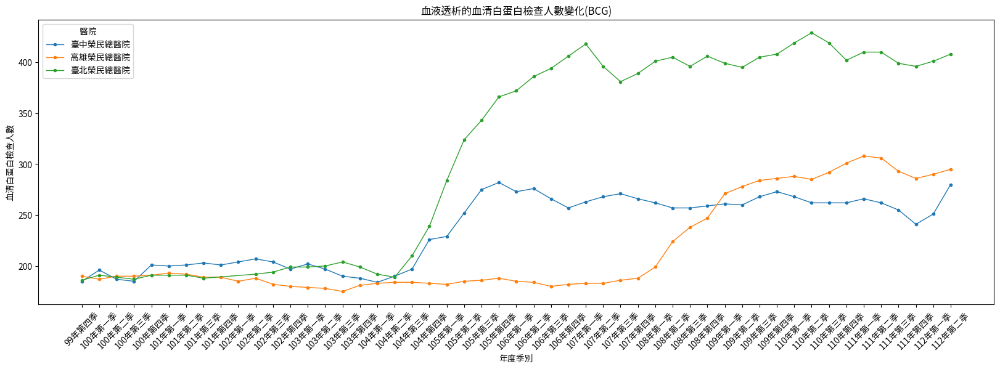

In [76]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '臺北榮民總醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data1 = data2[(data2['醫事機構名稱'] == '臺中榮民總醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '高雄榮民總醫院') & (data2['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析的血清白蛋白檢查人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCP/榮總)

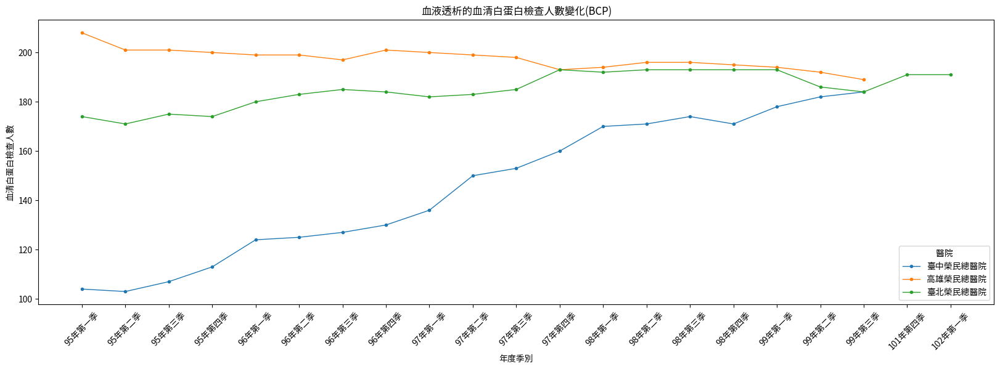

In [77]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '臺北榮民總醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data1 = data2[(data2['醫事機構名稱'] == '臺中榮民總醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '高雄榮民總醫院') & (data2['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析的血清白蛋白檢查人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCG/長庚)

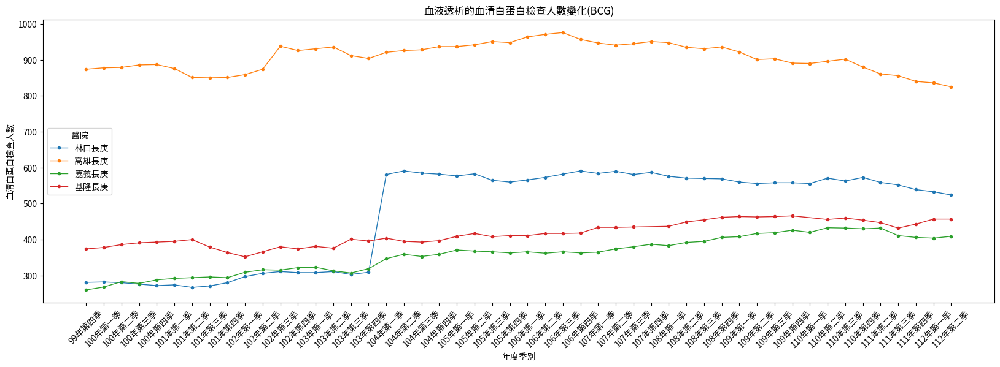

In [78]:
# 篩選符合條件的資料

filtered_data = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data1 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)


# 添加標題和標籤
plt.title('血液透析的血清白蛋白檢查人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白檢查人數(BCP/長庚)


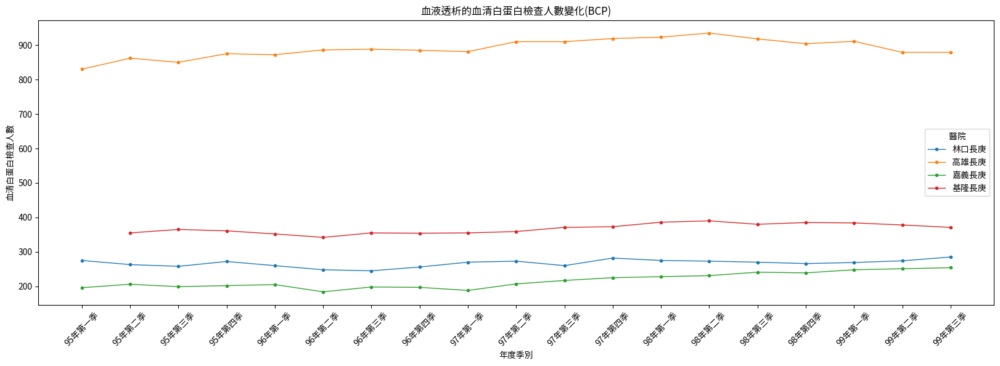

In [79]:
# 篩選符合條件的資料

filtered_data = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data1 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白檢查人數'], marker='o', linestyle='-', linewidth=1, markersize=3)


# 添加標題和標籤
plt.title('血液透析的血清白蛋白檢查人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白檢查人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白受檢率 (BCG/榮總)

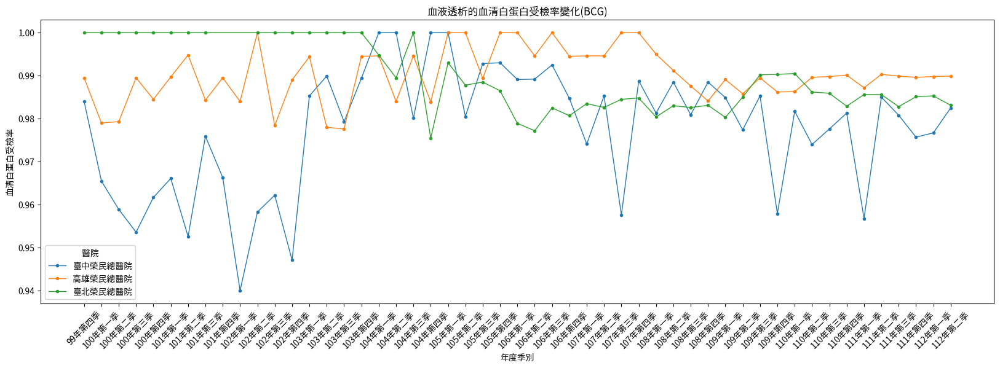

In [80]:
# 篩選符合條件的資料
filtered_data1 = data2[(data2['醫事機構名稱'] == '臺中榮民總醫院') & (data2['檢測方法'] == 'BCG') & (data2['特約類別'] == '醫學中心')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '高雄榮民總醫院') & (data2['檢測方法'] == 'BCG') & (data2['特約類別'] == '醫學中心')]

filtered_data = data2[(data2['醫事機構名稱'] == '臺北榮民總醫院') & (data2['檢測方法'] == 'BCG') & (data2['特約類別'] == '醫學中心')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析的血清白蛋白受檢率變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白受檢率(BCP/榮總)

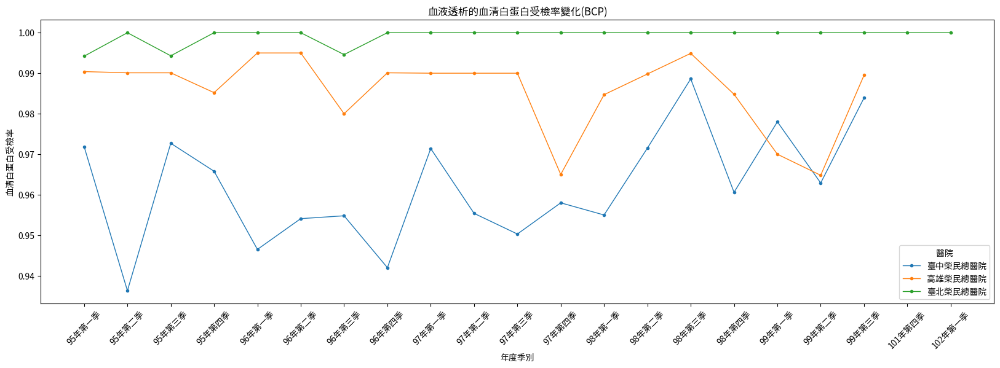

In [81]:
# 篩選符合條件的資料
filtered_data1 = data2[(data2['醫事機構名稱'] == '臺中榮民總醫院') & (data2['檢測方法'] == 'BCP') & (data2['特約類別'] == '醫學中心')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '高雄榮民總醫院') & (data2['檢測方法'] == 'BCP') & (data2['特約類別'] == '醫學中心')]

filtered_data = data2[(data2['醫事機構名稱'] == '臺北榮民總醫院') & (data2['檢測方法'] == 'BCP') & (data2['特約類別'] == '醫學中心')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data1['年度季別'], filtered_data1['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析的血清白蛋白受檢率變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血清白蛋白受檢率 (BCG/長庚)

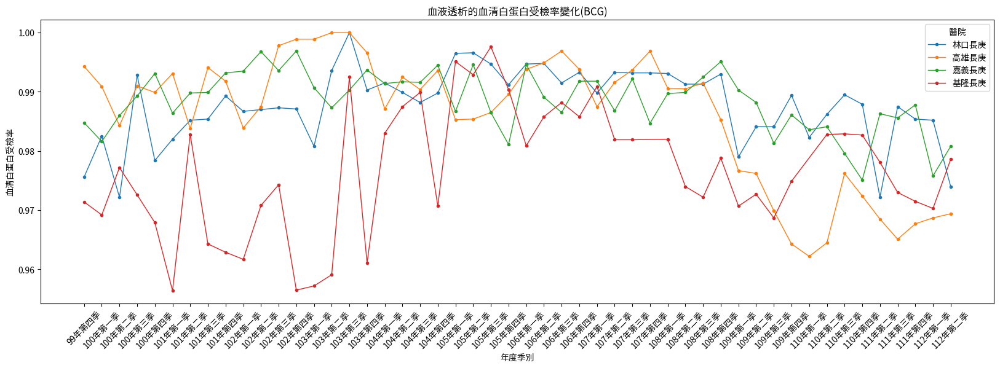

In [82]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data4 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data4['年度季別'], filtered_data4['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析的血清白蛋白受檢率變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚","基隆長庚"], title='醫院')
plt.show()

### 血清白蛋白受檢率 (BCP/長庚)

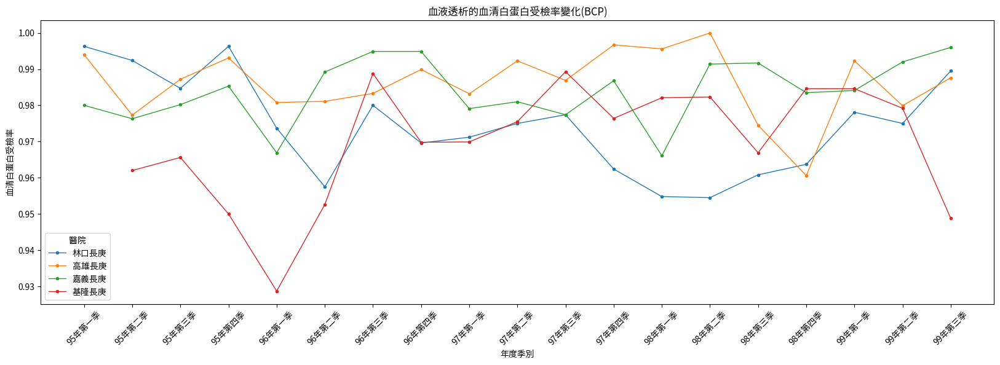

In [83]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data4 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data4['年度季別'], filtered_data4['血清白蛋白受檢率'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析的血清白蛋白受檢率變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血清白蛋白受檢率')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚","基隆長庚"], title='醫院')
plt.show()

### 血液透析人數 (BCG/榮總)

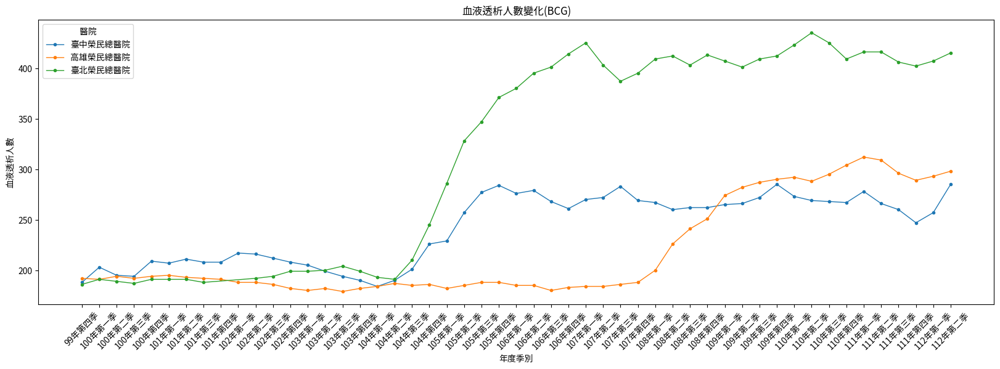

In [84]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '臺北榮民總醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data1 = data2[(data2['醫事機構名稱'] == '臺中榮民總醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '高雄榮民總醫院') & (data2['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血液透析人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血液透析人數 (BCP/榮總)

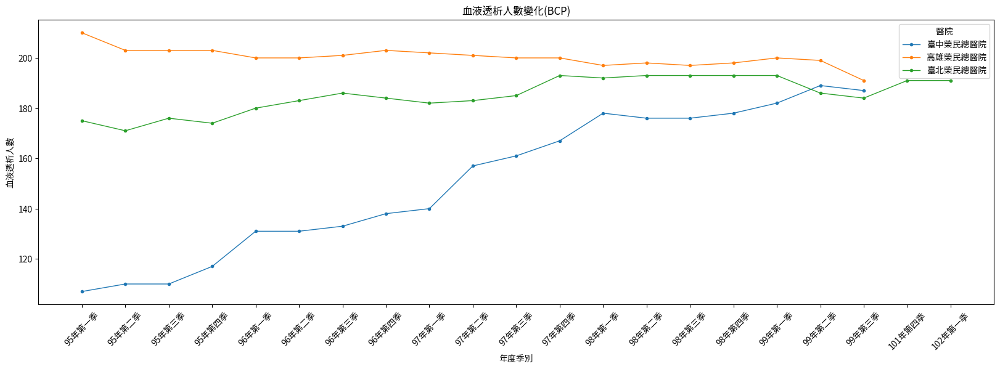

In [85]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '臺北榮民總醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data1 = data2[(data2['醫事機構名稱'] == '臺中榮民總醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '高雄榮民總醫院') & (data2['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度季別'], filtered_data1['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度季別'], filtered_data['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血液透析人數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 血液透析人數 (BCG/長庚)

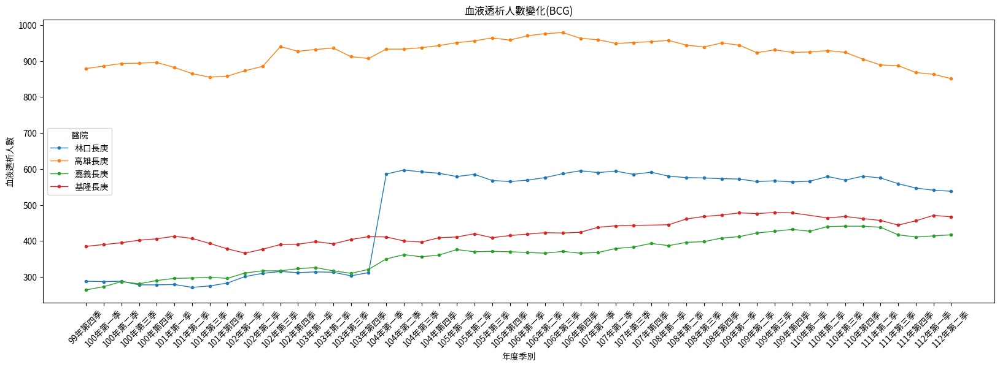

In [86]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

filtered_data4 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCG')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data4['年度季別'], filtered_data4['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析人數變化(BCG)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血液透析人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚","基隆長庚"], title='醫院')
plt.show()

### 血液透析人數 (BCP/長庚)

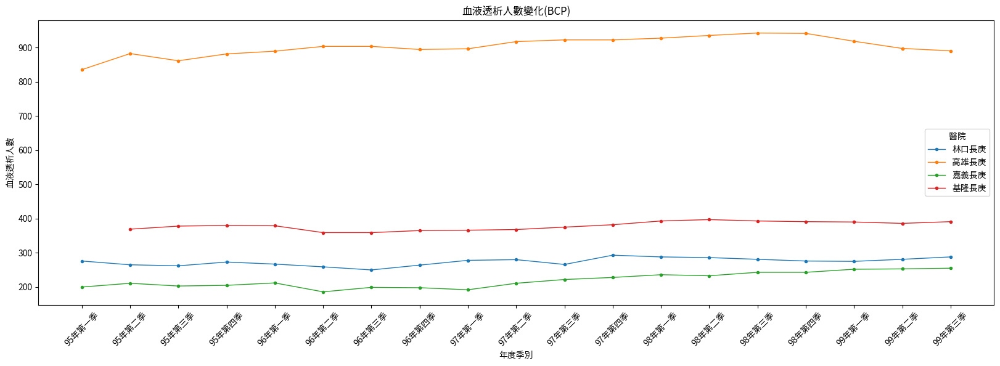

In [87]:
# 篩選符合條件的資料
filtered_data = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data2 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data3 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

filtered_data4 = data2[(data2['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院') & (data2['檢測方法'] == 'BCP')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度季別'], filtered_data['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度季別'], filtered_data2['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度季別'], filtered_data3['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data4['年度季別'], filtered_data4['血液透析人數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('血液透析人數變化(BCP)')
plt.xlabel('年度季別')
plt.xticks(rotation=45)
plt.ylabel('血液透析人數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚","基隆長庚"], title='醫院')
plt.show()

## 三、瀏覽資料 "血液透析瘻管重建率.csv"

In [88]:
data3 = pd.read_csv("血液透析瘻管重建率.csv")
data3.head()

,年度,醫事機構代碼,醫事機構名稱,特約類別,瘻管重建人次數,血液透析透析人月數,瘻管重建率_每1000人月,院所腎臟專科醫師數,院所是否參與健保計畫,院所是否參與國健署計畫,縣市別,鄉鎮別
0,95年第二季,0101090517,臺北市立聯合醫院,區域醫院,9.0,3190.5,0.0028,11.0,否,否,臺北市,大同區
1,95年第四季,0101090517,臺北市立聯合醫院,區域醫院,6.0,3182.6,0.0018,11.0,否,否,臺北市,大同區
2,96年第二季,0101090517,臺北市立聯合醫院,區域醫院,4.0,3226.2,0.0012,12.0,是,否,臺北市,大同區
3,96年第四季,0101090517,臺北市立聯合醫院,區域醫院,15.0,3239.8,0.0046,12.0,是,否,臺北市,大同區
4,97年第二季,0101090517,臺北市立聯合醫院,區域醫院,17.0,3271.4,0.0051,12.0,是,否,臺北市,大同區


In [89]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17155 entries, 0 to 17154
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   年度             17155 non-null  object 
 1   醫事機構代碼         17155 non-null  object 
 2   醫事機構名稱         17155 non-null  object 
 3   特約類別           17155 non-null  object 
 4   瘻管重建人次數        17155 non-null  float64
 5   血液透析透析人月數      17155 non-null  float64
 6   瘻管重建率_每1000人月  17155 non-null  float64
 7   院所腎臟專科醫師數      16834 non-null  float64
 8   院所是否參與健保計畫     17155 non-null  object 
 9   院所是否參與國健署計畫    16650 non-null  object 
 10  縣市別            17155 non-null  object 
 11  鄉鎮別            17155 non-null  object 
dtypes: float64(4), object(8)
memory usage: 1.6+ MB


## 檢查缺失值 (data3)

In [90]:
# 檢查欄位是否有 NaN (空值)
for index, col in enumerate(data3.columns):
  print(f"第{index+1}個欄位(i.e., {col}) 的缺失值有{data3[col].isnull().sum()}筆")

第1個欄位(i.e., 年度) 的缺失值有0筆
第2個欄位(i.e., 醫事機構代碼) 的缺失值有0筆
第3個欄位(i.e., 醫事機構名稱) 的缺失值有0筆
第4個欄位(i.e., 特約類別) 的缺失值有0筆
第5個欄位(i.e., 瘻管重建人次數) 的缺失值有0筆
第6個欄位(i.e., 血液透析透析人月數) 的缺失值有0筆
第7個欄位(i.e., 瘻管重建率_每1000人月) 的缺失值有0筆
第8個欄位(i.e., 院所腎臟專科醫師數) 的缺失值有321筆
第9個欄位(i.e., 院所是否參與健保計畫) 的缺失值有0筆
第10個欄位(i.e., 院所是否參與國健署計畫) 的缺失值有505筆
第11個欄位(i.e., 縣市別) 的缺失值有0筆
第12個欄位(i.e., 鄉鎮別) 的缺失值有0筆


## 將"院所是否參與國健署計畫"的缺失欄添加為"否"，
## 將"院所腎臟專科醫師數"的缺失欄添加為該欄總和的平均值

In [91]:
data3['院所是否參與國健署計畫'].fillna('否', inplace=True)

# 計算欄位的平均值
mean_value = data3['院所腎臟專科醫師數'].mean()
# 將空值替換為平均值
data3['院所腎臟專科醫師數'].fillna(mean_value, inplace=True)

In [92]:
# 檢查欄位是否有 NaN (空值)
for index, col in enumerate(data3.columns):
  print(f"第{index+1}個欄位(i.e., {col}) 的缺失值有{data3[col].isnull().sum()}筆")

第1個欄位(i.e., 年度) 的缺失值有0筆
第2個欄位(i.e., 醫事機構代碼) 的缺失值有0筆
第3個欄位(i.e., 醫事機構名稱) 的缺失值有0筆
第4個欄位(i.e., 特約類別) 的缺失值有0筆
第5個欄位(i.e., 瘻管重建人次數) 的缺失值有0筆
第6個欄位(i.e., 血液透析透析人月數) 的缺失值有0筆
第7個欄位(i.e., 瘻管重建率_每1000人月) 的缺失值有0筆
第8個欄位(i.e., 院所腎臟專科醫師數) 的缺失值有0筆
第9個欄位(i.e., 院所是否參與健保計畫) 的缺失值有0筆
第10個欄位(i.e., 院所是否參與國健署計畫) 的缺失值有0筆
第11個欄位(i.e., 縣市別) 的缺失值有0筆
第12個欄位(i.e., 鄉鎮別) 的缺失值有0筆


## 分析

### 院所腎臟專科醫師數(榮總)

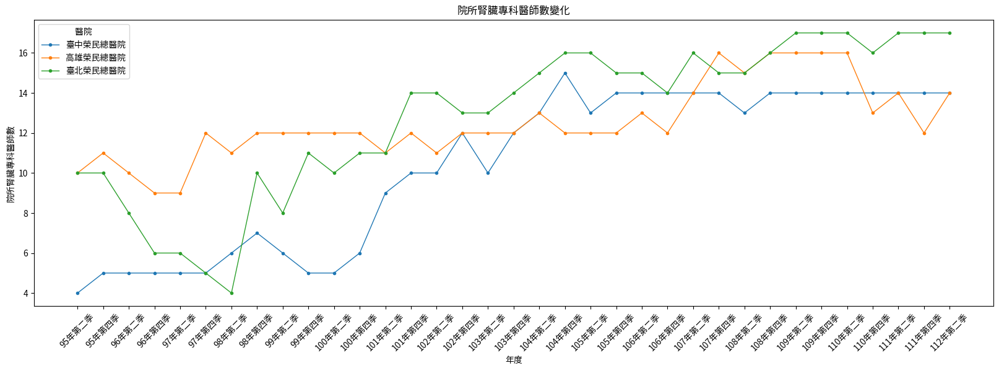

In [93]:
# 篩選符合條件的資料
filtered_data = data3[(data3['醫事機構名稱'] == '臺北榮民總醫院')]

filtered_data1 = data3[(data3['醫事機構名稱'] == '臺中榮民總醫院')]

filtered_data2 = data3[(data3['醫事機構名稱'] == '高雄榮民總醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度'], filtered_data1['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度'], filtered_data2['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度'], filtered_data['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('院所腎臟專科醫師數變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('院所腎臟專科醫師數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 院所腎臟專科醫師數(長庚)

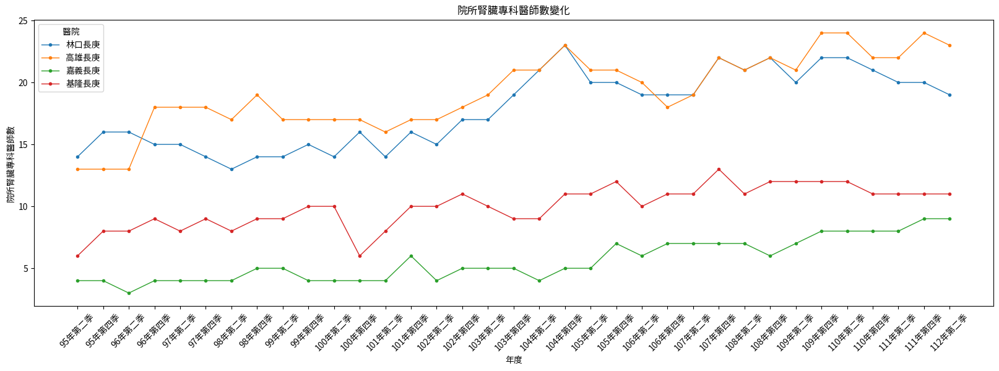

In [94]:
# 篩選符合條件的資料
filtered_data = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院')]

filtered_data1 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院')]

filtered_data2 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院')]

filtered_data3 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度'], filtered_data['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data1['年度'], filtered_data1['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度'], filtered_data2['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度'], filtered_data3['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('院所腎臟專科醫師數變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('院所腎臟專科醫師數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 院所腎臟專科醫師數(各縣市)

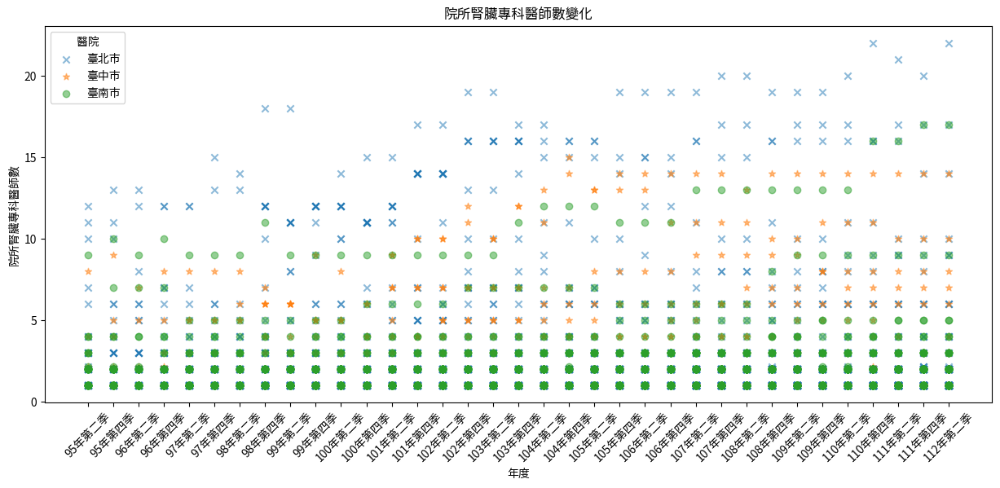

In [95]:
# 篩選符合條件的資料
filtered_data = data3[(data3['縣市別'] == '臺北市')]

filtered_data1 = data3[(data3['縣市別'] == '新北市')]

filtered_data2 = data3[(data3['縣市別'] == '臺中市')]

filtered_data3 = data3[(data3['縣市別'] == '臺南市')]

filtered_data4 = data3[(data3['縣市別'] == '高雄市')]

plt.figure(figsize=(15, 6))

plt.scatter(filtered_data['年度'], filtered_data['院所腎臟專科醫師數'], marker='x', alpha=0.5)
plt.scatter(filtered_data2['年度'], filtered_data2['院所腎臟專科醫師數'], marker='*', alpha=0.5)
plt.scatter(filtered_data3['年度'], filtered_data3['院所腎臟專科醫師數'], alpha=0.5)

# plt.plot(filtered_data['年度'], filtered_data['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
# plt.plot(filtered_data2['年度'], filtered_data2['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
# plt.plot(filtered_data3['年度'], filtered_data3['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)


# 添加標題和標籤
plt.title('院所腎臟專科醫師數變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('院所腎臟專科醫師數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

### 瘻管重建人次數(榮總)

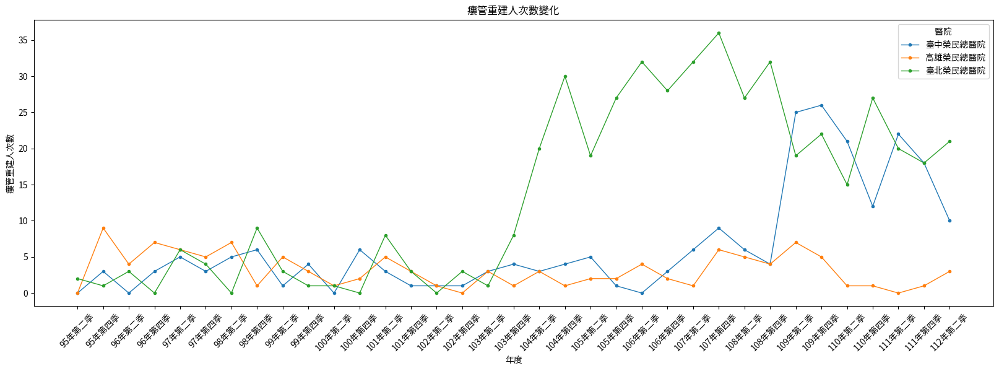

In [96]:
# 篩選符合條件的資料
filtered_data = data3[(data3['醫事機構名稱'] == '臺北榮民總醫院')]

filtered_data1 = data3[(data3['醫事機構名稱'] == '臺中榮民總醫院')]

filtered_data2 = data3[(data3['醫事機構名稱'] == '高雄榮民總醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度'], filtered_data1['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度'], filtered_data2['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度'], filtered_data['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('瘻管重建人次數變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('瘻管重建人次數')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 瘻管重建率(榮總)

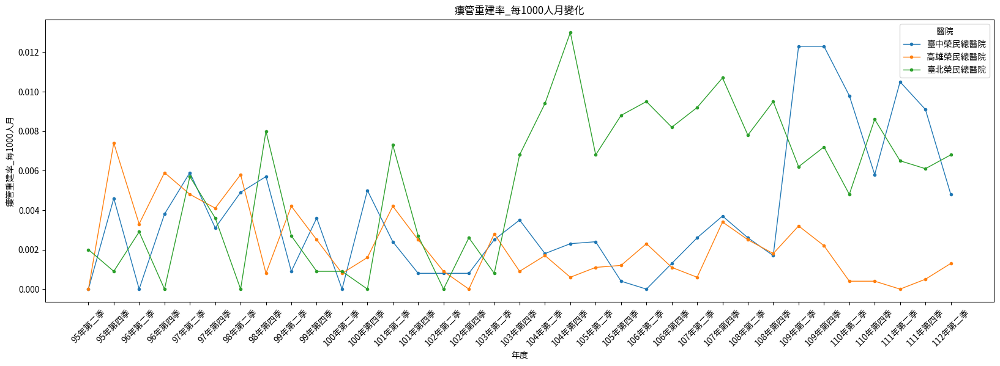

In [97]:
# 篩選符合條件的資料
filtered_data = data3[(data3['醫事機構名稱'] == '臺北榮民總醫院')]

filtered_data1 = data3[(data3['醫事機構名稱'] == '臺中榮民總醫院')]

filtered_data2 = data3[(data3['醫事機構名稱'] == '高雄榮民總醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖

plt.plot(filtered_data1['年度'], filtered_data1['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度'], filtered_data2['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data['年度'], filtered_data['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('瘻管重建率_每1000人月變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('瘻管重建率_每1000人月')

plt.legend(["臺中榮民總醫院", "高雄榮民總醫院", "臺北榮民總醫院"], title='醫院')
plt.show()

### 瘻管重建人次數(長庚)

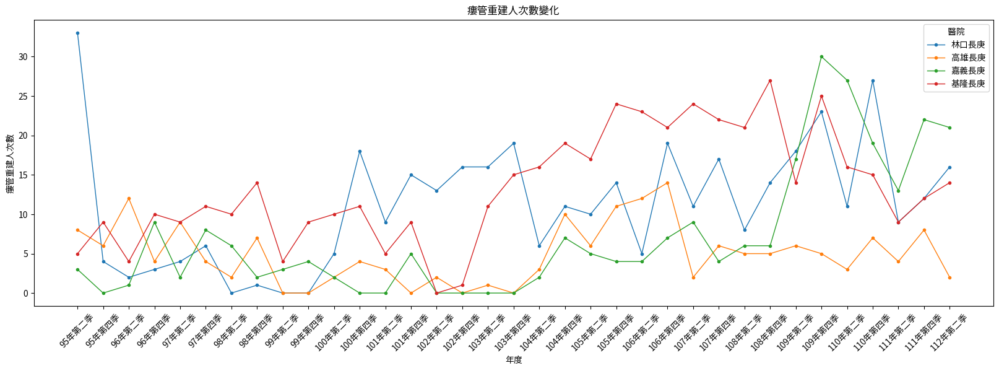

In [98]:
# 篩選符合條件的資料
filtered_data = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院')]

filtered_data2 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院')]

filtered_data3 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院')]

filtered_data4 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度'], filtered_data['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度'], filtered_data2['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度'], filtered_data3['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data4['年度'], filtered_data4['瘻管重建人次數'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('瘻管重建人次數變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('瘻管重建人次數')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 瘻管重建率(長庚)

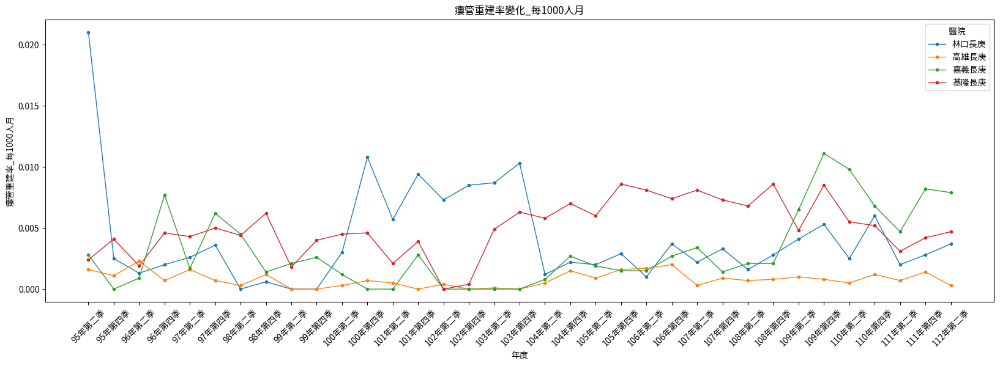

In [99]:
# 篩選符合條件的資料
filtered_data = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人林口長庚紀念醫院')]

filtered_data2 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人高雄長庚紀念醫院')]

filtered_data3 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人嘉義長庚紀念醫院')]

filtered_data4 = data3[(data3['醫事機構名稱'] == '長庚醫療財團法人基隆長庚紀念醫院')]

plt.figure(figsize=(20, 6))
# 使用 Matplotlib 繪製折線圖
plt.plot(filtered_data['年度'], filtered_data['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data2['年度'], filtered_data2['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data3['年度'], filtered_data3['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)
plt.plot(filtered_data4['年度'], filtered_data4['瘻管重建率_每1000人月'], marker='o', linestyle='-', linewidth=1, markersize=3)

# 添加標題和標籤
plt.title('瘻管重建率變化_每1000人月')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('瘻管重建率_每1000人月')

plt.legend(["林口長庚", "高雄長庚", "嘉義長庚", "基隆長庚"], title='醫院')
plt.show()

### 瘻管重建人次數(各縣市)

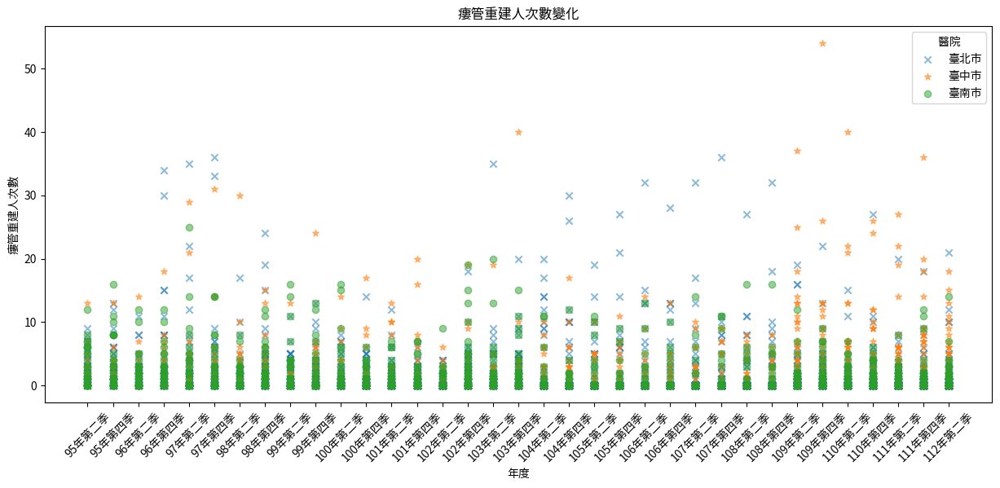

In [100]:
# 篩選符合條件的資料
filtered_data = data3[(data3['縣市別'] == '臺北市')]

filtered_data1 = data3[(data3['縣市別'] == '新北市')]

filtered_data2 = data3[(data3['縣市別'] == '臺中市')]

filtered_data3 = data3[(data3['縣市別'] == '臺南市')]

filtered_data4 = data3[(data3['縣市別'] == '高雄市')]

plt.figure(figsize=(15, 6))

plt.scatter(filtered_data['年度'], filtered_data['瘻管重建人次數'], marker='x', alpha=0.5)
plt.scatter(filtered_data2['年度'], filtered_data2['瘻管重建人次數'], marker='*', alpha=0.5)
plt.scatter(filtered_data3['年度'], filtered_data3['瘻管重建人次數'], alpha=0.5)

# plt.plot(filtered_data['年度'], filtered_data['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
# plt.plot(filtered_data2['年度'], filtered_data2['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)
# plt.plot(filtered_data3['年度'], filtered_data3['院所腎臟專科醫師數'], marker='o', linestyle='-', linewidth=1, markersize=3)


# 添加標題和標籤
plt.title('瘻管重建人次數變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('瘻管重建人次數')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

### 瘻管重建率(各縣市)

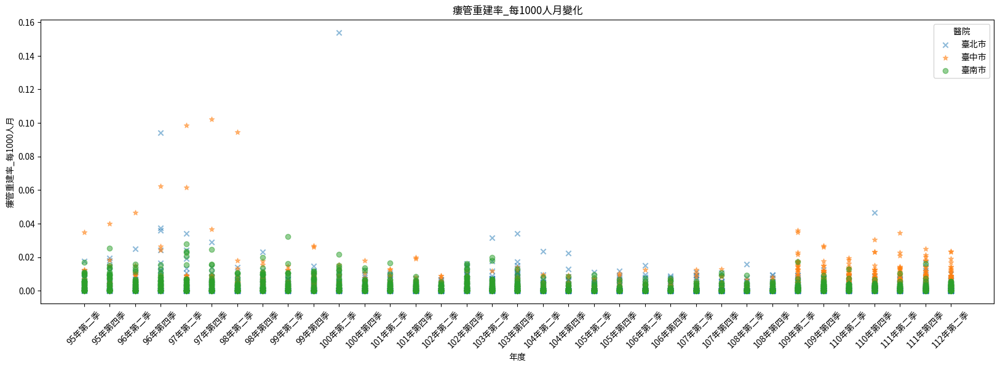

In [101]:
# 篩選符合條件的資料
filtered_data = data3[(data3['縣市別'] == '臺北市')]

filtered_data1 = data3[(data3['縣市別'] == '新北市')]

filtered_data2 = data3[(data3['縣市別'] == '臺中市')]

filtered_data3 = data3[(data3['縣市別'] == '臺南市')]

filtered_data4 = data3[(data3['縣市別'] == '高雄市')]

plt.figure(figsize=(20, 6))

plt.scatter(filtered_data['年度'], filtered_data['瘻管重建率_每1000人月'], marker='x', alpha=0.5)
plt.scatter(filtered_data2['年度'], filtered_data2['瘻管重建率_每1000人月'], marker='*', alpha=0.5)
plt.scatter(filtered_data3['年度'], filtered_data3['瘻管重建率_每1000人月'], alpha=0.5)

# 添加標題和標籤
plt.title('瘻管重建率_每1000人月變化')
plt.xlabel('年度')
plt.xticks(rotation=45)
plt.ylabel('瘻管重建率_每1000人月')

plt.legend(["臺北市", "臺中市", "臺南市"], title='醫院')
plt.show()

# 資料視覺化

### 腹膜透析的醫事機構名稱 長方圖

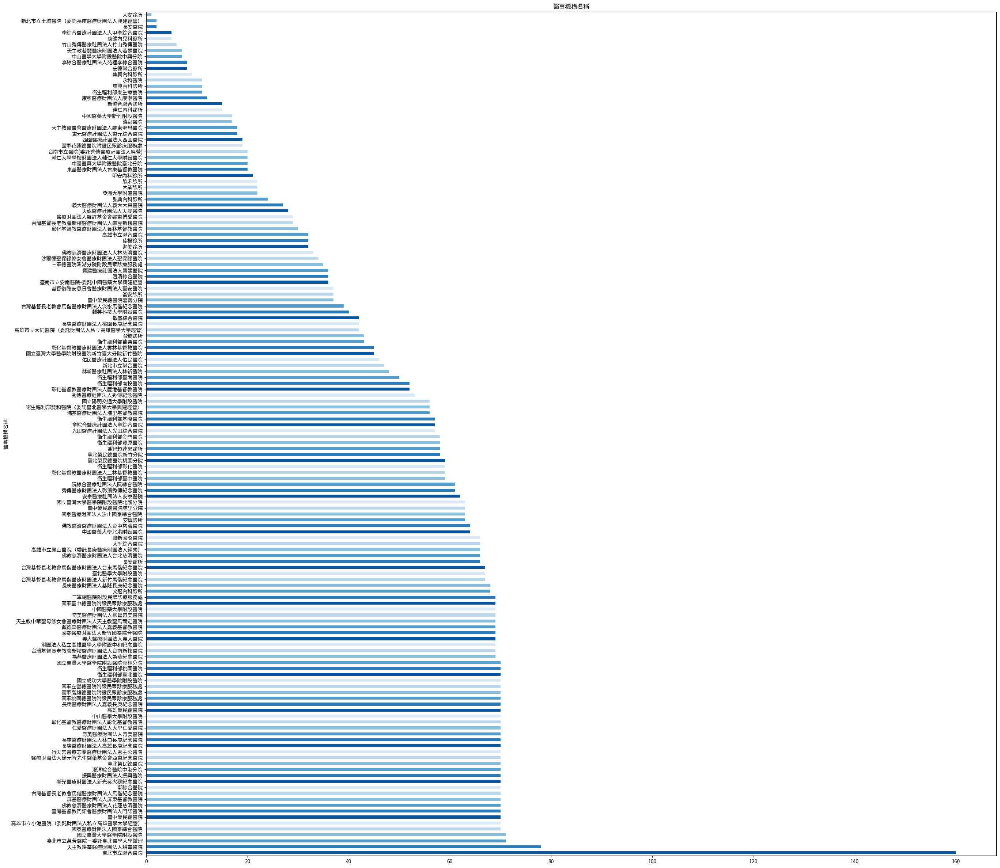

In [102]:
hospital_count = data1['醫事機構名稱'].value_counts()
hospital_count.plot(kind = 'barh', color = sns.color_palette("Blues_r"), title = "醫事機構名稱", figsize = (30,30));

### 血液透析的醫事機構名稱 長方圖

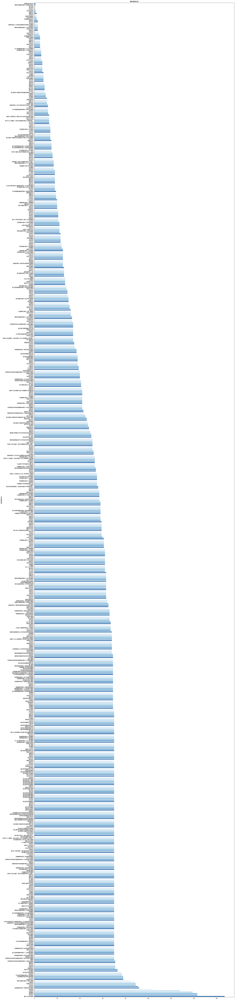

In [103]:
hospital_count = data2['醫事機構名稱'].value_counts()
hospital_count.plot(kind = 'barh', color = sns.color_palette("Blues_r"), title = "醫事機構名稱", figsize = (30,150));

### 腹膜透析的特約類別 長方圖

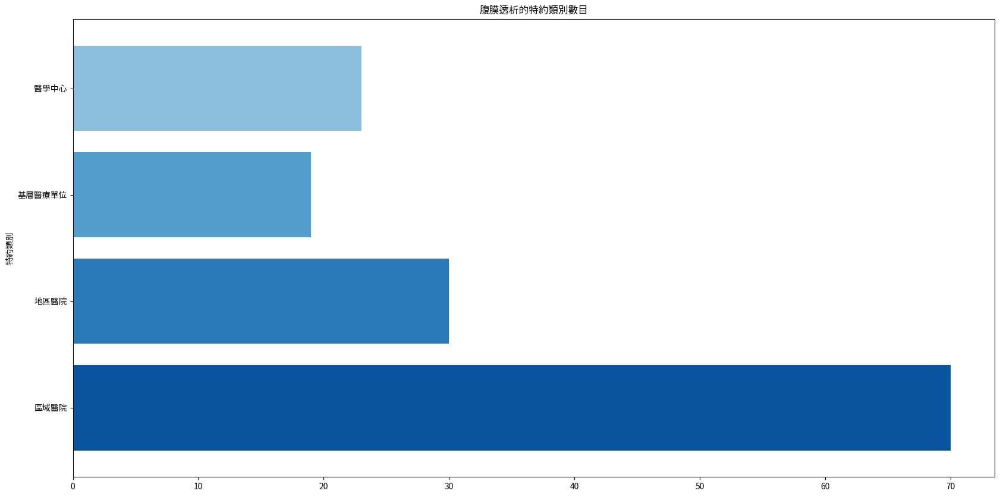

In [126]:
newdata1 = data1.drop_duplicates(subset=['特約類別','醫事機構名稱'])
hospital_category_count = newdata1.groupby('特約類別').size()
hospital_category_count.plot(kind = 'barh', color = sns.color_palette("Blues_r"), title = "腹膜透析的特約類別數目", figsize = (20,10),width=0.8);

# plt.figure(figsize=(12, 6))

# # 使用 drop_duplicates() 去除重複資料
# newdata2 = data1.drop_duplicates(subset=['特約類別', '醫事機構名稱'])

# # 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
# health_insurance_df = newdata2.groupby('特約類別').size()

# # 繪製圓餅圖
# plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("Blues_r"), autopct='%0.2f%%')
# plt.title("特約類別")
# plt.show()

### 血液透析的特約類別 長方圖

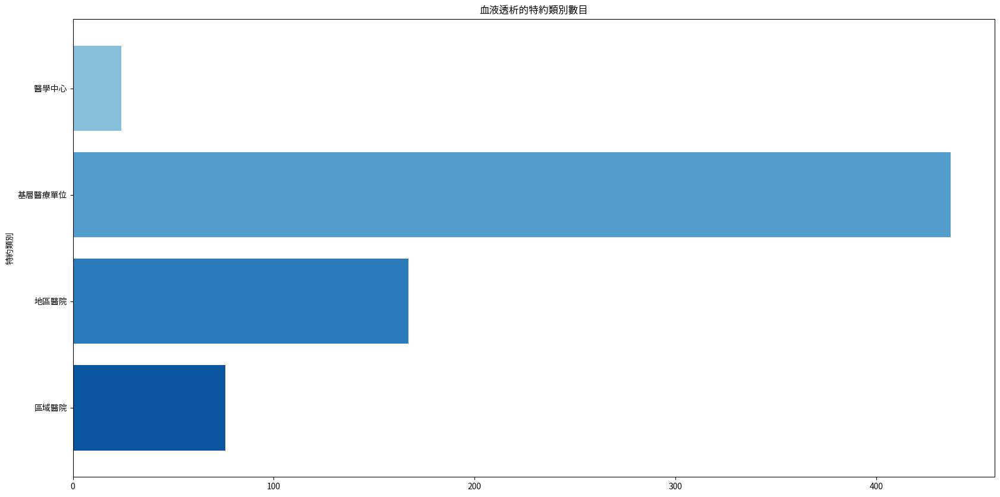

In [125]:
newdata2 = data2.drop_duplicates(subset=['特約類別','醫事機構名稱'])
hospital_category_count = newdata2.groupby('特約類別').size()
hospital_category_count.plot(kind = 'barh', color = sns.color_palette("Blues_r"), title = "血液透析的特約類別數目", figsize = (20,10),width=0.8);

# plt.figure(figsize=(12, 6))

# # 使用 drop_duplicates() 去除重複資料
# newdata2 = data2.drop_duplicates(subset=['特約類別', '醫事機構名稱'])

# # 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
# health_insurance_df = newdata2.groupby('特約類別').size()

# # 繪製圓餅圖
# plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("Blues_r"), autopct='%0.2f%%')
# plt.title("特約類別")
# plt.show()

### 瘻管重建的特約類別 長方圖

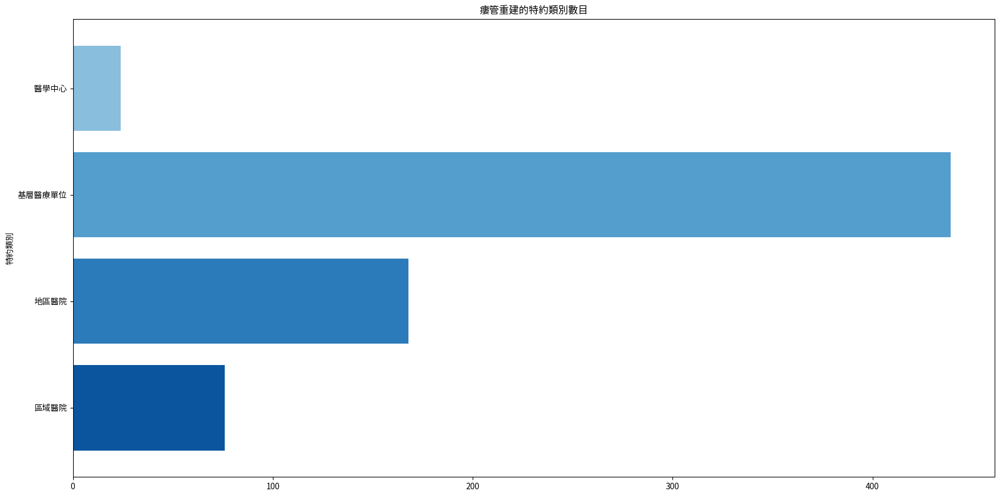

In [124]:
newdata3 = data3.drop_duplicates(subset=['特約類別','醫事機構名稱'])
hospital_category_count = newdata3.groupby('特約類別').size()
hospital_category_count.plot(kind = 'barh', color = sns.color_palette("Blues_r"), title = "瘻管重建的特約類別數目", figsize = (20,10),width=0.8);

# plt.figure(figsize=(12, 6))

# # 使用 drop_duplicates() 去除重複資料
# newdata3 = data3.drop_duplicates(subset=['特約類別', '醫事機構名稱'])

# # 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
# health_insurance_df3 = newdata3.groupby('特約類別').size()

# # 繪製圓餅圖
# plt.pie(health_insurance_df3, labels=health_insurance_df3.index, colors=sns.color_palette("Blues_r"), autopct='%0.2f%%')
# plt.title("特約類別")
# plt.show()

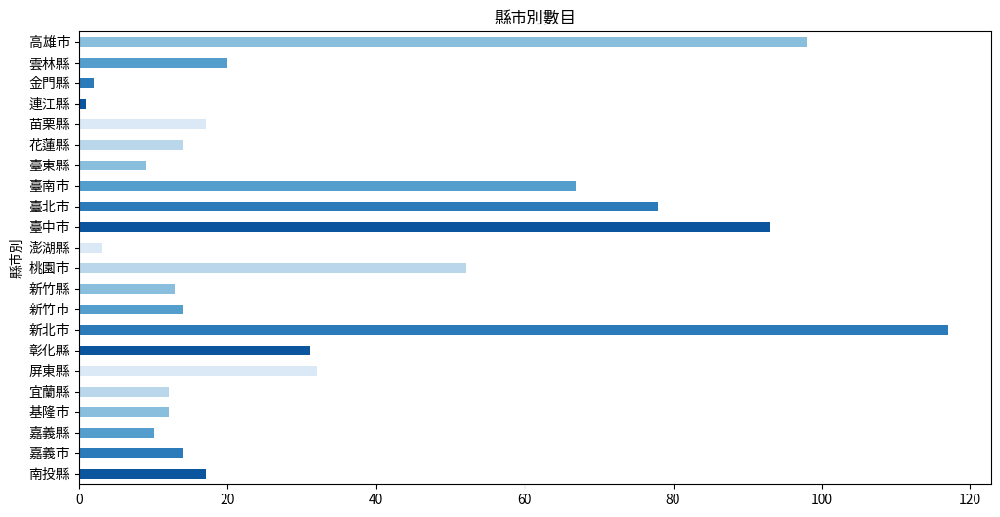

In [107]:
newdata2 = data2.drop_duplicates(subset=['縣市別','醫事機構名稱'])
hospital_category_count = newdata2.groupby('縣市別').size()
hospital_category_count.plot(kind = 'barh', color = sns.color_palette("Blues_r"), title = "縣市別數目", figsize = (12,6));

### 腹膜透析的檢測方法 圓餅圖

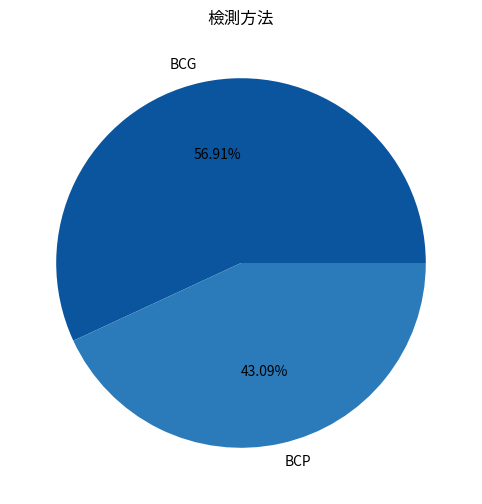

In [108]:
# plt.figure(figsize = (12, 6))

# health_insurance_df = (data1['檢測方法'].value_counts(normalize = True)).sort_values(ascending = False).to_frame()
# plt.pie(health_insurance_df['proportion'], labels = health_insurance_df.index, colors = sns.color_palette("Blues_r")
#        ,autopct = '%0.2f%%');
# plt.title("檢測方法");

plt.figure(figsize=(12, 6))

# 使用 drop_duplicates() 去除重複資料
newdata2 = data1.drop_duplicates(subset=['檢測方法', '醫事機構名稱'])

# 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
health_insurance_df = newdata2.groupby('檢測方法').size()

# 繪製圓餅圖
plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("Blues_r"), autopct='%0.2f%%')
plt.title("檢測方法")
plt.show()

### 血液透析的檢測方法 圓餅圖

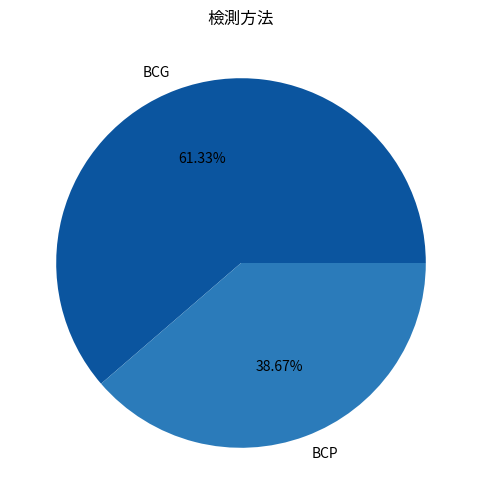

In [109]:
plt.figure(figsize=(12, 6))

# 使用 drop_duplicates() 去除重複資料
newdata2 = data2.drop_duplicates(subset=['檢測方法', '醫事機構名稱'])

# 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
health_insurance_df = newdata2.groupby('檢測方法').size()

# 繪製圓餅圖
plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("Blues_r"), autopct='%0.2f%%')
plt.title("檢測方法")
plt.show()

### 腹膜透析的院所是否參與健保計畫 圓餅圖

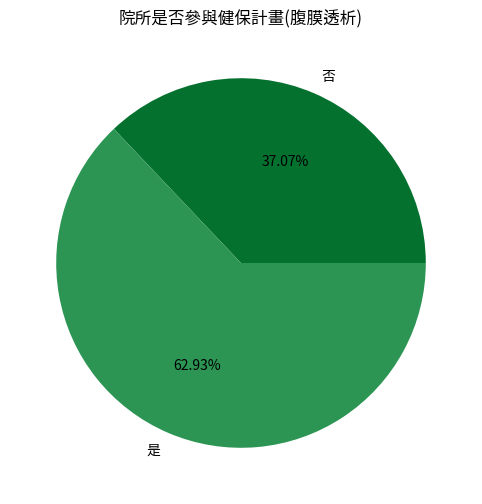

In [110]:
# plt.figure(figsize = (12, 6))
# health_insurance_df = (data1['院所是否參與健保計畫'].value_counts(normalize = True)).sort_values(ascending = False).to_frame()
# plt.pie(health_insurance_df['proportion'], labels = health_insurance_df.index, colors = sns.color_palette("BuGn_r")
#        ,autopct = '%0.2f%%');
# plt.title("院所是否參與健保計畫");

plt.figure(figsize=(12, 6))

# 使用 drop_duplicates() 去除重複資料
newdata2 = data1.drop_duplicates(subset=['院所是否參與健保計畫', '醫事機構名稱'])

# 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
health_insurance_df = newdata2.groupby('院所是否參與健保計畫').size()

# 繪製圓餅圖
plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("BuGn_r"), autopct='%0.2f%%')
plt.title("院所是否參與健保計畫(腹膜透析)")
plt.show()

### 血液透析的院所是否參與健保計畫 圓餅圖

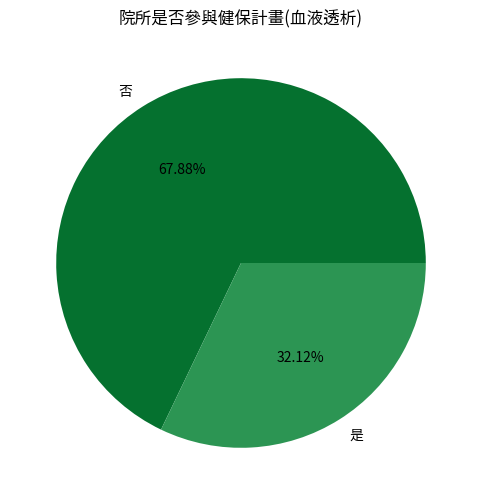

In [111]:
plt.figure(figsize=(12, 6))

# 使用 drop_duplicates() 去除重複資料
newdata2 = data2.drop_duplicates(subset=['院所是否參與健保計畫', '醫事機構名稱'])

# 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
health_insurance_df = newdata2.groupby('院所是否參與健保計畫').size()

# 繪製圓餅圖
plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("BuGn_r"), autopct='%0.2f%%')
plt.title("院所是否參與健保計畫(血液透析)")
plt.show()

### 腹膜透析的院所是否參與國健署計畫 圓餅圖

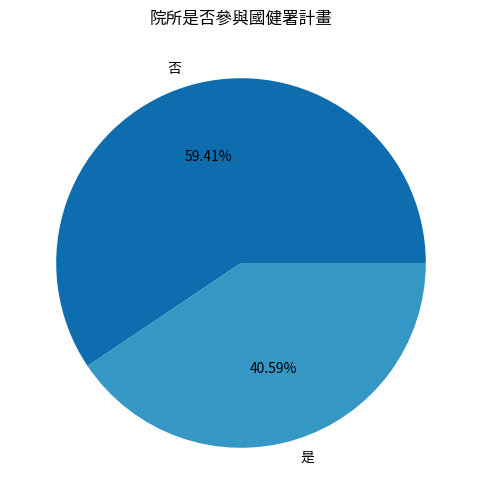

In [112]:
# plt.figure(figsize = (12, 6))
# health_insurance_df = (data1['院所是否參與國健署計畫'].value_counts(normalize = True)).sort_values(ascending = False).to_frame()
# plt.pie(health_insurance_df['proportion'], labels = health_insurance_df.index, colors = sns.color_palette("GnBu_r")
#        ,autopct = '%0.2f%%');
# plt.title("院所是否參與國健署計畫");

plt.figure(figsize=(12, 6))

# 使用 drop_duplicates() 去除重複資料
newdata2 = data1.drop_duplicates(subset=['院所是否參與國健署計畫', '醫事機構名稱'])

# 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
health_insurance_df = newdata2.groupby('院所是否參與國健署計畫').size()

# 繪製圓餅圖
plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("GnBu_r"), autopct='%0.2f%%')
plt.title("院所是否參與國健署計畫")
plt.show()

### 血液透析的院所是否參與國健署計畫 圓餅圖

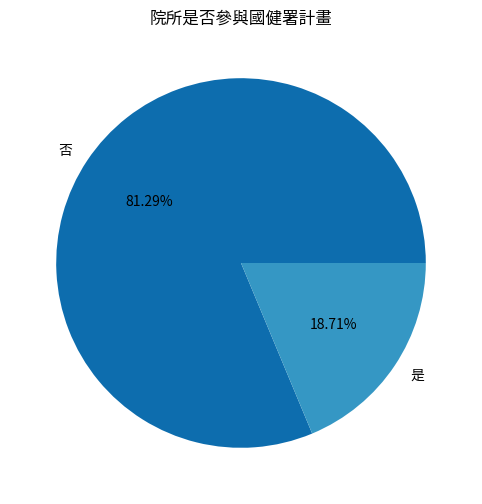

In [113]:
plt.figure(figsize=(12, 6))

# 使用 drop_duplicates() 去除重複資料
newdata2 = data2.drop_duplicates(subset=['院所是否參與國健署計畫', '醫事機構名稱'])

# 使用 groupby() 函數按照檢測方法分組，並計算每個檢測方法對應的大小
health_insurance_df = newdata2.groupby('院所是否參與國健署計畫').size()

# 繪製圓餅圖
plt.pie(health_insurance_df, labels=health_insurance_df.index, colors=sns.color_palette("GnBu_r"), autopct='%0.2f%%')
plt.title("院所是否參與國健署計畫")
plt.show()